# importing libraries for the project

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor , GradientBoostingRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.metrics import d2_absolute_error_score,mean_squared_error, r2_score
import xgboost as xgb
import lightgbm as lgb
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings('ignore')


In [ ]:
dataset=pd.read_csv('/city_day.csv')

In [ ]:
dataset

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.00,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,0.00,0.00,0.00,54.0,Satisfactory


# EDA : Exploratory data analysis

In [ ]:
print(dataset.head())

        City        Date  PM2.5  PM10     NO    NO2    NOx  NH3     CO    SO2  \
0  Ahmedabad  2015-01-01    NaN   NaN   0.92  18.22  17.15  NaN   0.92  27.64   
1  Ahmedabad  2015-01-02    NaN   NaN   0.97  15.69  16.46  NaN   0.97  24.55   
2  Ahmedabad  2015-01-03    NaN   NaN  17.40  19.30  29.70  NaN  17.40  29.07   
3  Ahmedabad  2015-01-04    NaN   NaN   1.70  18.48  17.97  NaN   1.70  18.59   
4  Ahmedabad  2015-01-05    NaN   NaN  22.10  21.42  37.76  NaN  22.10  39.33   

       O3  Benzene  Toluene  Xylene  AQI AQI_Bucket  
0  133.36     0.00     0.02    0.00  NaN        NaN  
1   34.06     3.68     5.50    3.77  NaN        NaN  
2   30.70     6.80    16.40    2.25  NaN        NaN  
3   36.08     4.43    10.14    1.00  NaN        NaN  
4   39.31     7.01    18.89    2.78  NaN        NaN  


In [ ]:
print(dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        29531 non-null  object 
 1   Date        29531 non-null  object 
 2   PM2.5       24933 non-null  float64
 3   PM10        18391 non-null  float64
 4   NO          25949 non-null  float64
 5   NO2         25946 non-null  float64
 6   NOx         25346 non-null  float64
 7   NH3         19203 non-null  float64
 8   CO          27472 non-null  float64
 9   SO2         25677 non-null  float64
 10  O3          25509 non-null  float64
 11  Benzene     23908 non-null  float64
 12  Toluene     21490 non-null  float64
 13  Xylene      11422 non-null  float64
 14  AQI         24850 non-null  float64
 15  AQI_Bucket  24850 non-null  object 
dtypes: float64(13), object(3)
memory usage: 3.6+ MB
None


In [ ]:
d=dataset.describe()

In [ ]:
d

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24933.000000,18391.000000,25949.000000,25946.000000,25346.000000,19203.000000,27472.000000,25677.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.450578,118.127103,17.574730,28.560659,32.309123,23.483476,2.248598,14.531977,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.661449,90.605110,22.785846,24.474746,31.646011,25.684275,6.962884,18.133775,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.820000,56.255000,5.630000,11.750000,12.820000,8.580000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.590000,149.745000,19.950000,37.620000,40.127500,30.020000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


Checking for null values and treating them

In [ ]:
print(dataset.isnull().sum())

City              0
Date              0
PM2.5          4598
PM10          11140
NO             3582
NO2            3585
NOx            4185
NH3           10328
CO             2059
SO2            3854
O3             4022
Benzene        5623
Toluene        8041
Xylene        18109
AQI            4681
AQI_Bucket     4681
dtype: int64


In [ ]:
dataset.fillna(0, inplace=True)

In [ ]:
print(dataset.isnull().sum())

City          0
Date          0
PM2.5         0
PM10          0
NO            0
NO2           0
NOx           0
NH3           0
CO            0
SO2           0
O3            0
Benzene       0
Toluene       0
Xylene        0
AQI           0
AQI_Bucket    0
dtype: int64


In [ ]:
print(type(dataset))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
print(dataset.shape)

(29531, 16)


In [ ]:
print(dataset.nunique())

City             26
Date           2009
PM2.5         11717
PM10          12572
NO             5777
NO2            7405
NOx            8156
NH3            5923
CO             1779
SO2            4762
O3             7700
Benzene        1873
Toluene        3608
Xylene         1561
AQI             830
AQI_Bucket        7
dtype: int64


In [ ]:
print(dataset.columns)

Index(['City', 'Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket'],
      dtype='object')


# Data Visualisation

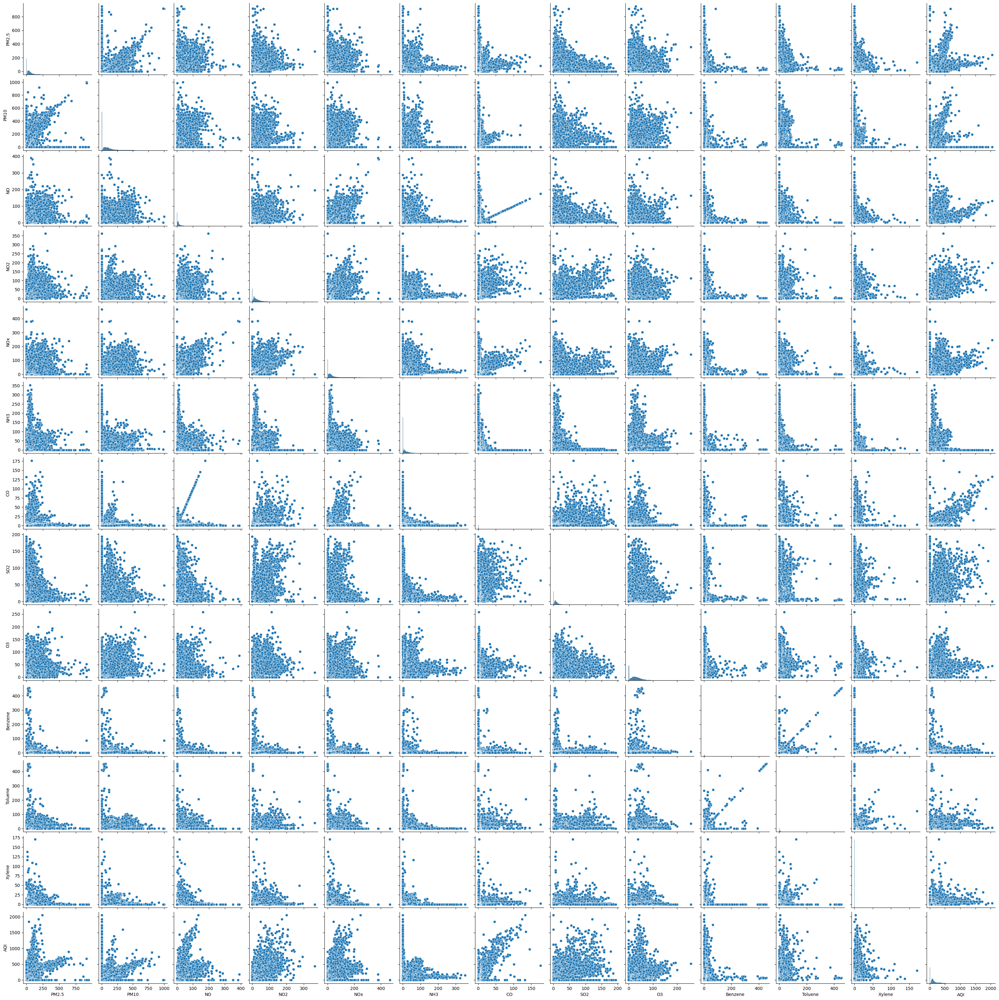

In [ ]:
sns.pairplot(data=dataset)

In [ ]:
dataset['City'].value_counts()

,count
City,
Ahmedabad,2009
Delhi,2009
Mumbai,2009
Bengaluru,2009
Lucknow,2009
Chennai,2009
Hyderabad,2006
Patna,1858
Gurugram,1679


AQI_Bucket
Moderate        8829
Satisfactory    8224
0               4681
Poor            2781
Very Poor       2337
Good            1341
Severe          1338
Name: count, dtype: int64


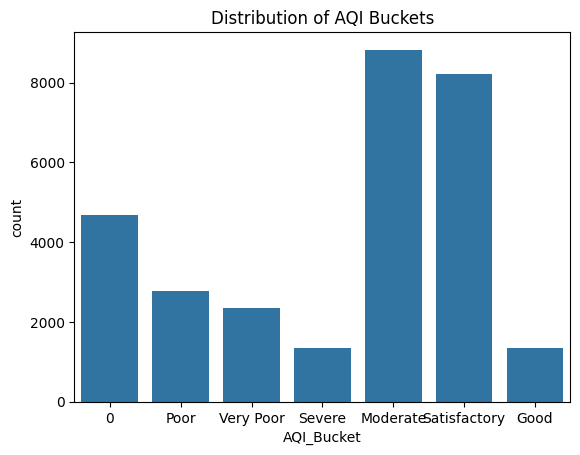

In [ ]:
# Count the occurrences of each AQI bucket
aqi_bucket_counts = dataset['AQI_Bucket'].value_counts()
print(aqi_bucket_counts)

# Plot the AQI bucket distribution
sns.countplot(x='AQI_Bucket', data=dataset)
plt.title('Distribution of AQI Buckets')
plt.show()


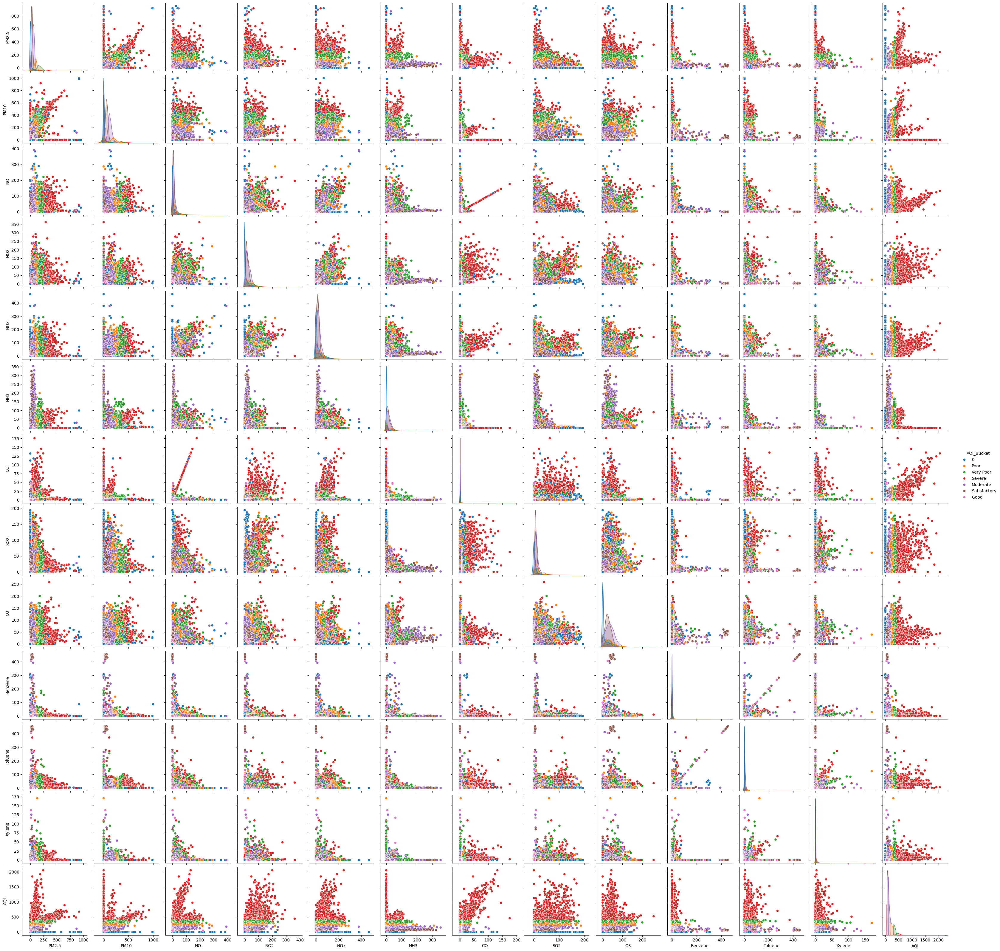

In [ ]:
# Pairplot of the dataset
sns.pairplot(data=dataset, hue='AQI_Bucket')
plt.show()


checking for linearity

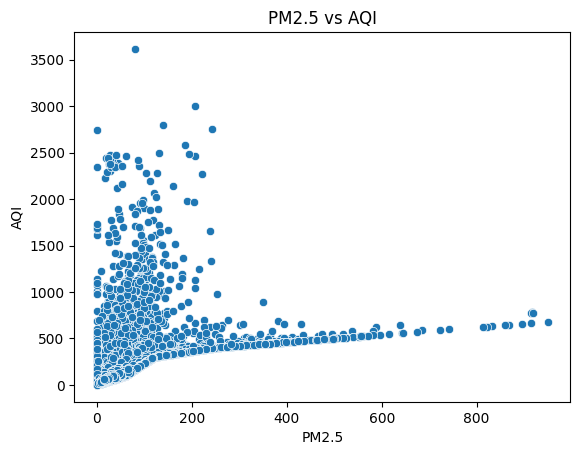

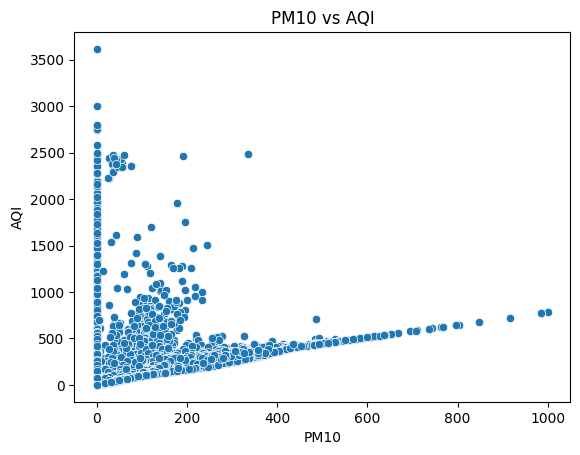

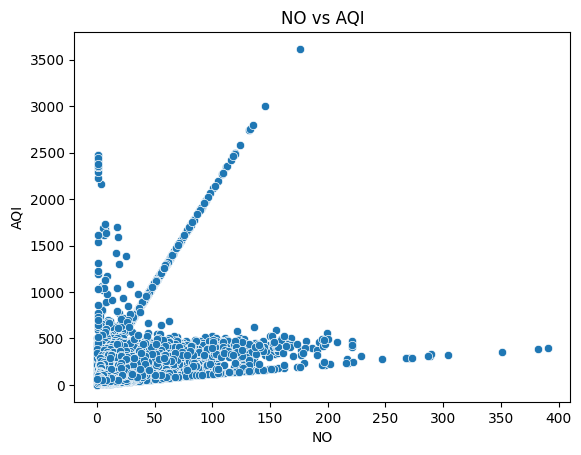

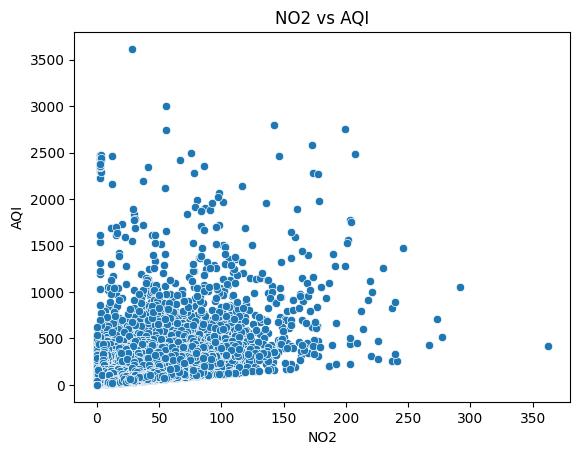

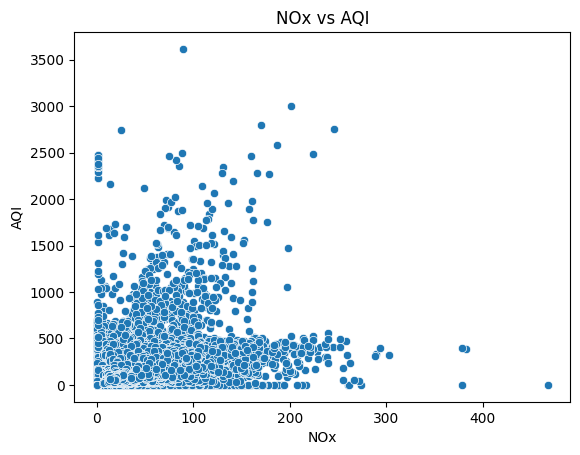

...

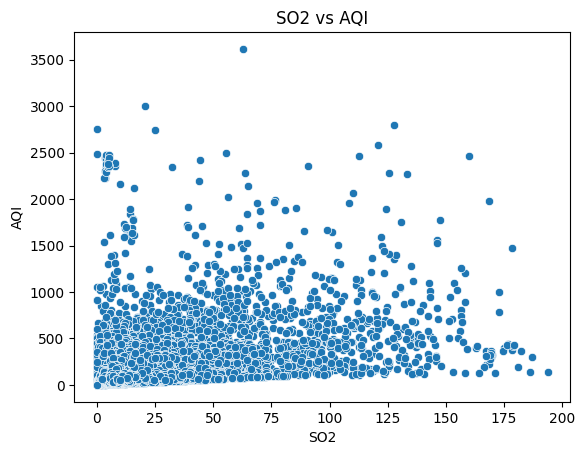

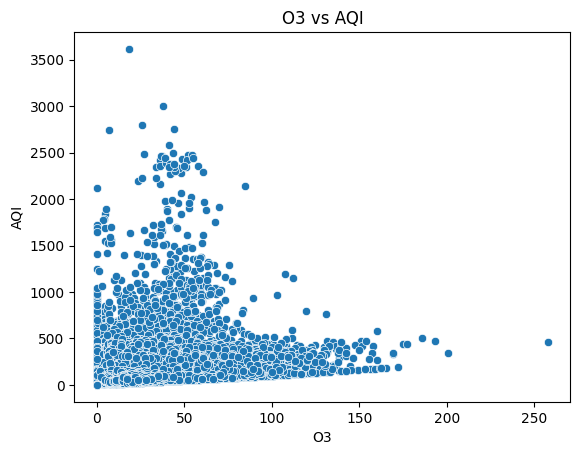

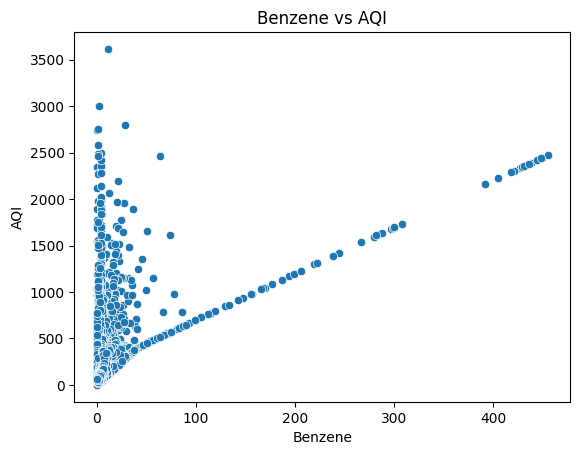

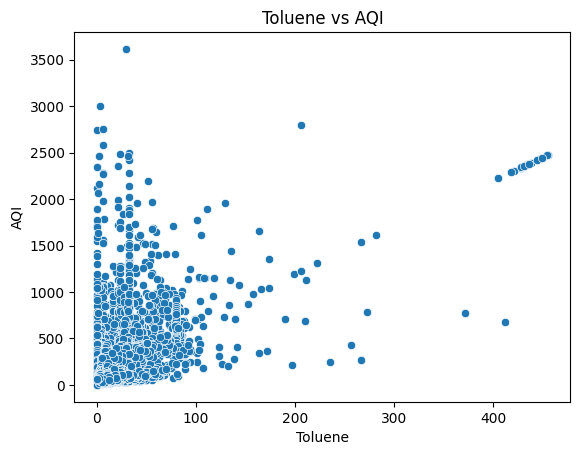

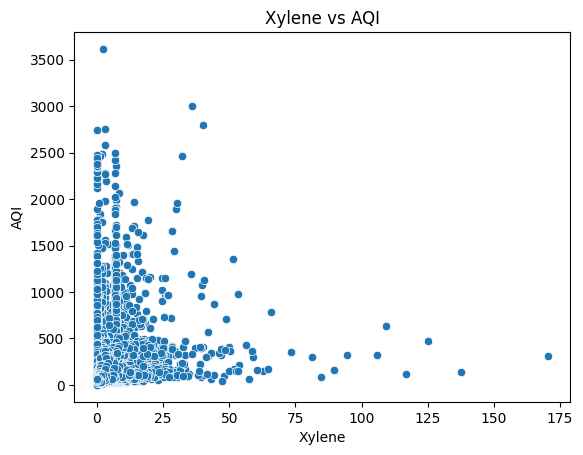

In [ ]:
features = [ 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene']

for feature in features:
    sns.scatterplot(x=dataset[feature], y=dataset['AQI'])
    plt.title(f'{feature} vs AQI')
    plt.xlabel(feature)
    plt.ylabel('AQI')
    plt.show()


In [ ]:
correlation_matrix = dataset[[ 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene','AQI']].corr()
print(correlation_matrix['AQI'].sort_values(ascending=False))

AQI        1.000000
CO         0.746019
PM2.5      0.541396
Toluene    0.533503
NO2        0.489153
Benzene    0.466005
SO2        0.444872
NO         0.421406
NOx        0.372143
PM10       0.241610
O3         0.226066
Xylene     0.192467
NH3        0.031447
Name: AQI, dtype: float64


1. Linear Regression

In [ ]:


# Define features and target
X = dataset[['CO', 'PM2.5', 'Toluene', 'NO2', 'Benzene', 'SO2', 'NO']]
y = dataset['AQI']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R-squared:', r2_score(y_test, y_pred))


Mean Squared Error: 2201.0812552405782
R-squared: 0.9197534365629721


2. Polynomial Regression

In [ ]:
# Define polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Initialize and train model
model_poly = LinearRegression()
model_poly.fit(X_train, y_train)

# Predict and evaluate
y_pred_poly = model_poly.predict(X_test)
print('Mean Squared Error (Poly):', mean_squared_error(y_test, y_pred_poly))
print('R-squared (Poly):', r2_score(y_test, y_pred_poly))

Mean Squared Error (Poly): 1436.5175818382756
R-squared (Poly): 0.9476277402367904


3. Tree-Based Models (Random Forest, Gradient Boosting)






In [ ]:

# Random Forest
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
print('Random Forest MSE:', mean_squared_error(y_test, y_pred_rf))
print('Random Forest R-squared:', r2_score(y_test, y_pred_rf))

# Gradient Boosting
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
print('Gradient Boosting MSE:', mean_squared_error(y_test, y_pred_gb))
print('Gradient Boosting R-squared:', r2_score(y_test, y_pred_gb))


Random Forest MSE: 536.5174399636625
Random Forest R-squared: 0.9804397585602036
Gradient Boosting MSE: 649.7839857042993
Gradient Boosting R-squared: 0.9763103103508618


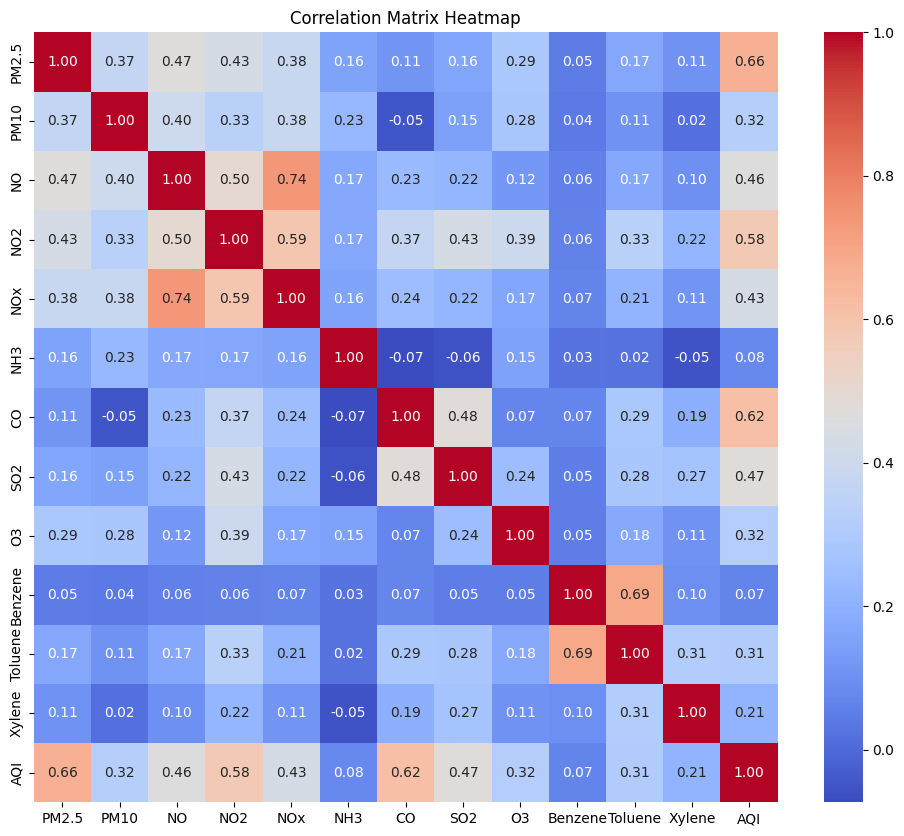

In [ ]:
# Select only numeric columns for correlation matrix
numeric_columns = dataset.select_dtypes(include=['float64', 'int64']).columns
dataset_numeric = dataset[numeric_columns]

# Compute the correlation matrix
correlation_matrix = dataset_numeric.corr()

# Generate a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()



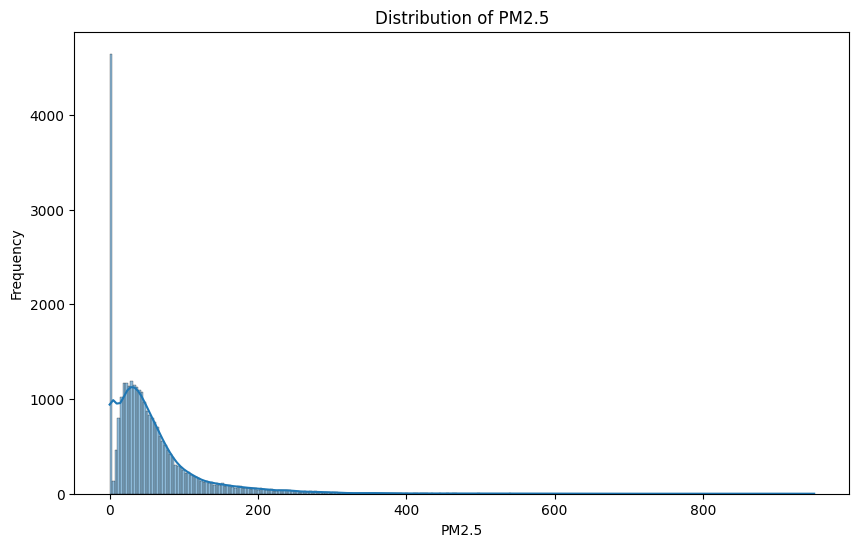

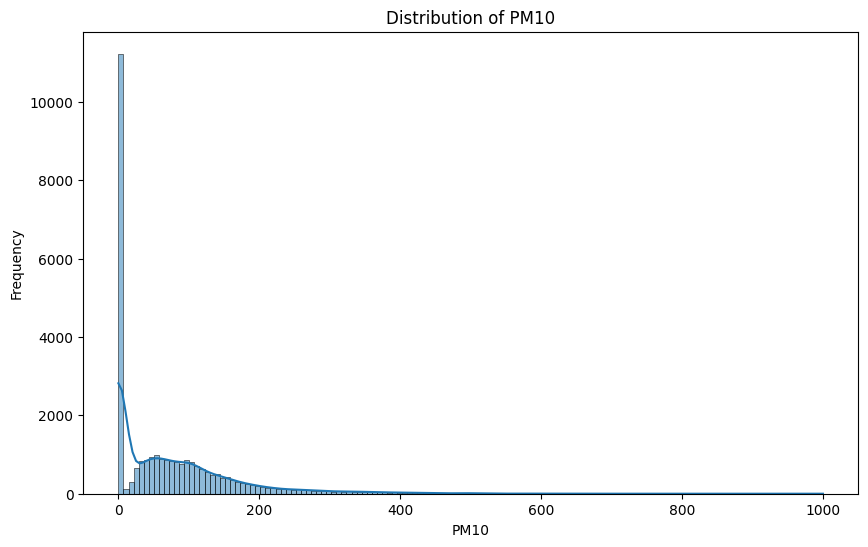

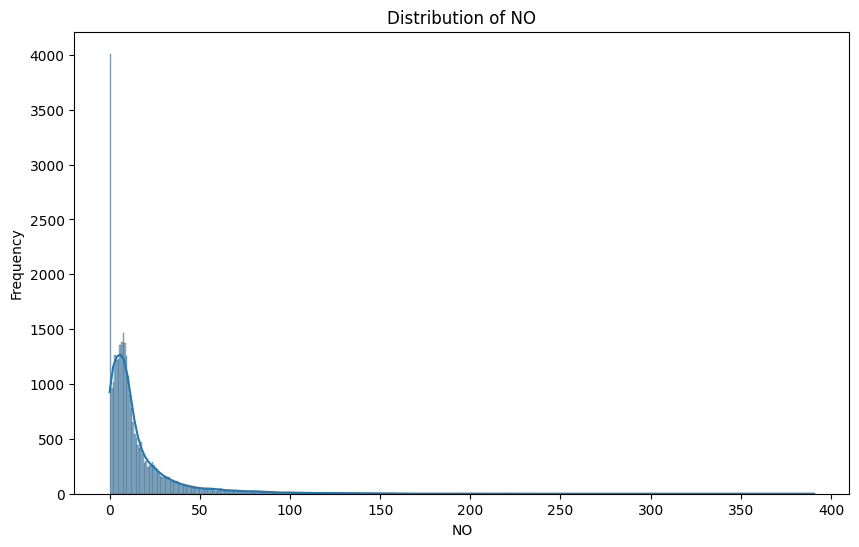

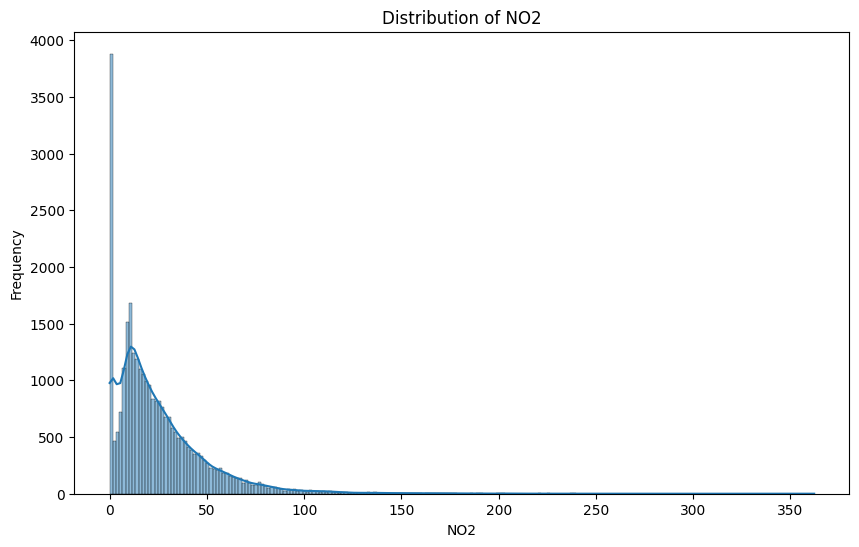

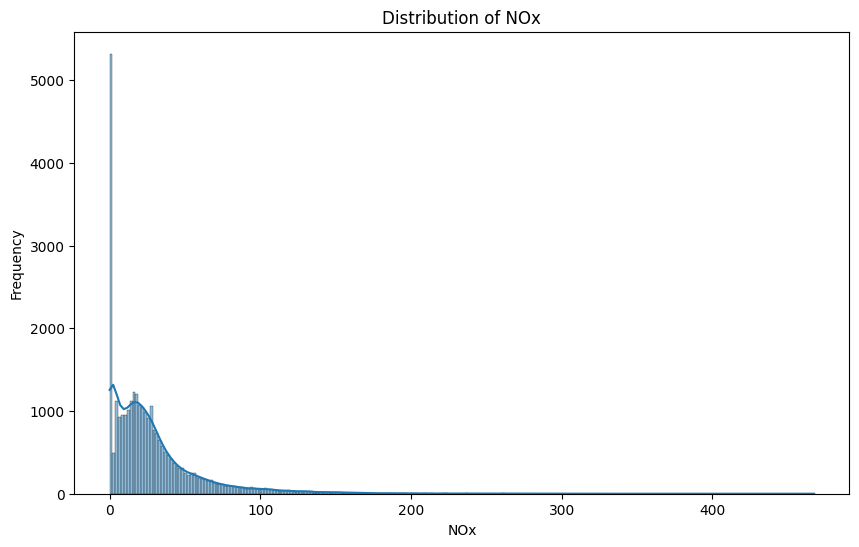

...

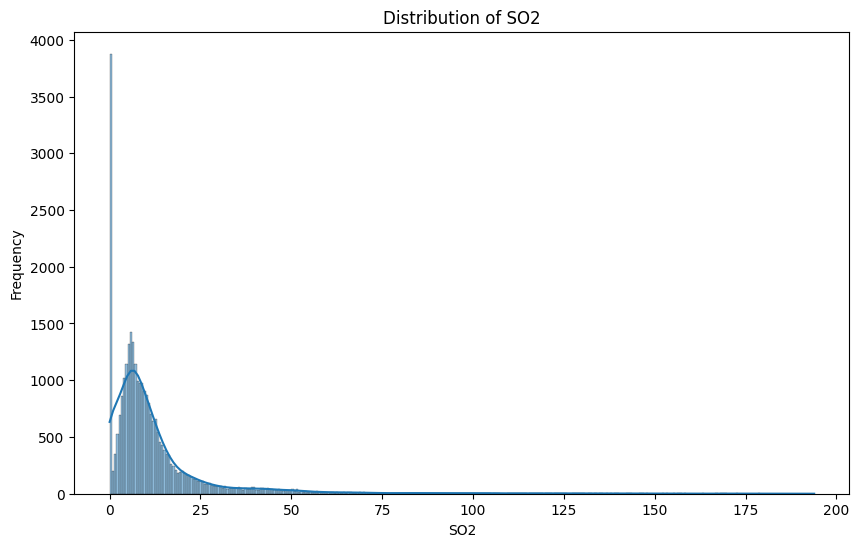

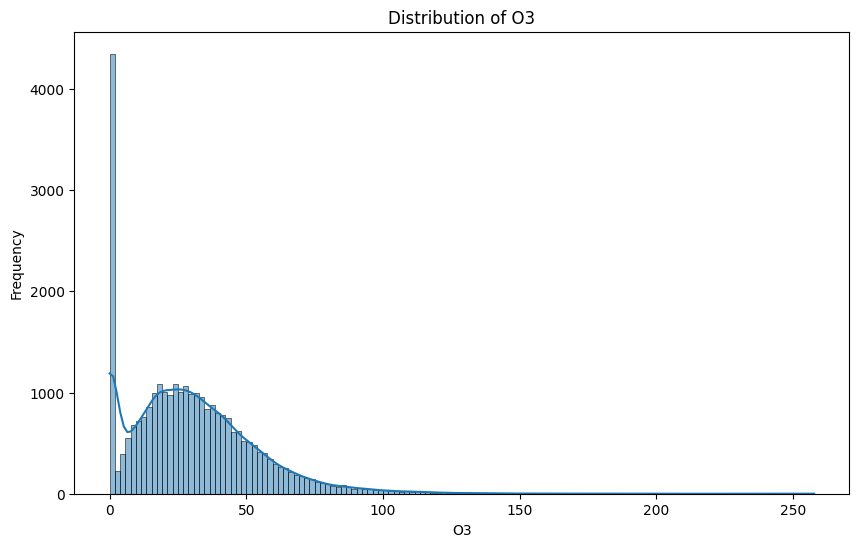

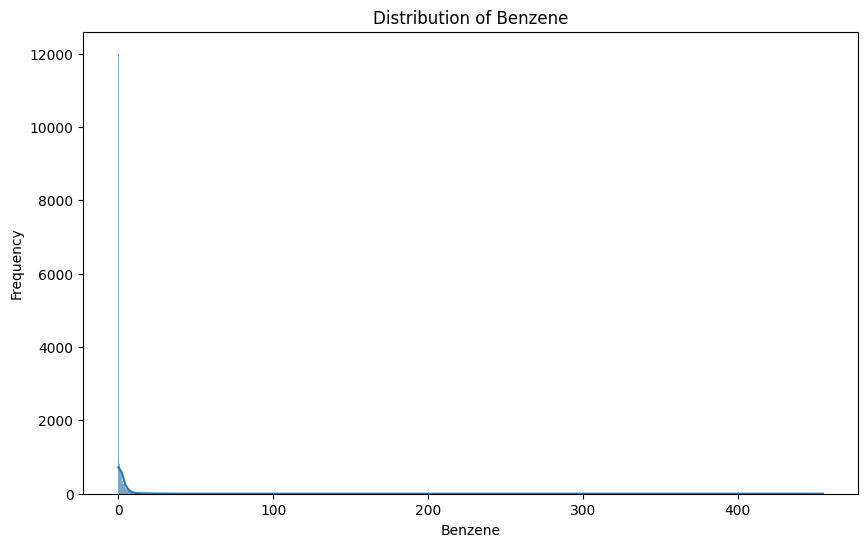

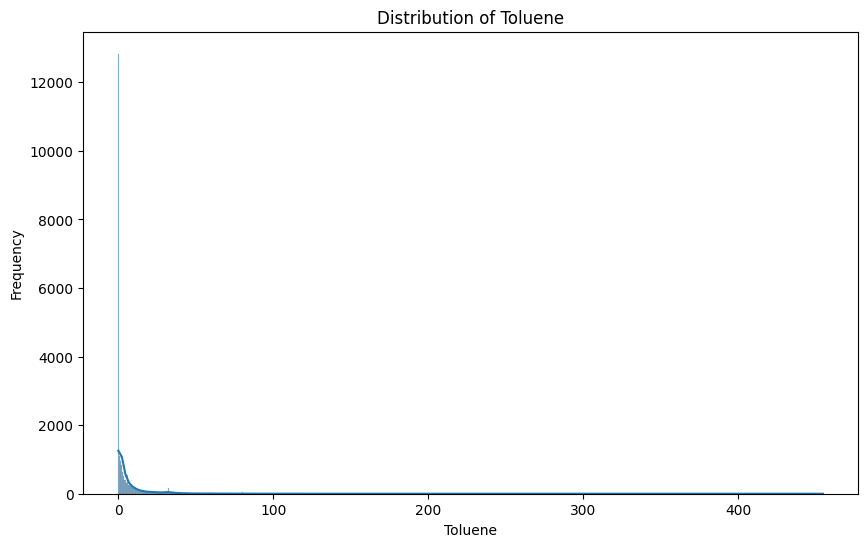

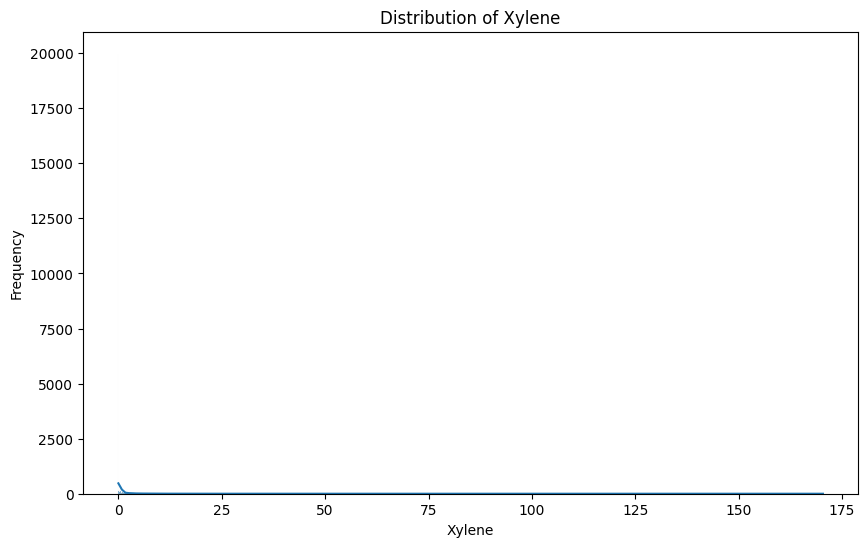

In [ ]:
# Plot distributions for each pollutant
pollutants = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']

for pollutant in pollutants:
    plt.figure(figsize=(10, 6))
    sns.histplot(dataset[pollutant], kde=True)
    plt.title(f'Distribution of {pollutant}')
    plt.xlabel(pollutant)
    plt.ylabel('Frequency')
    plt.show()


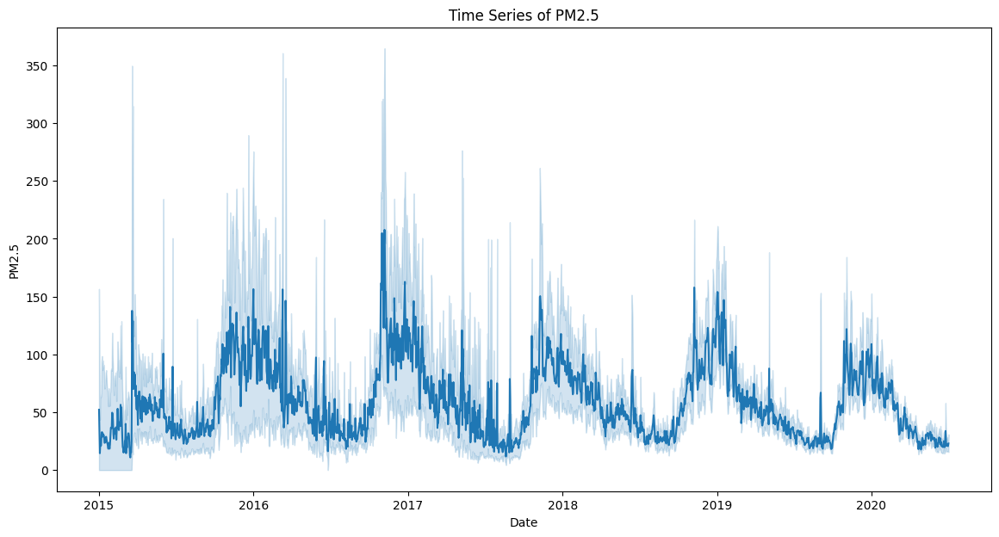

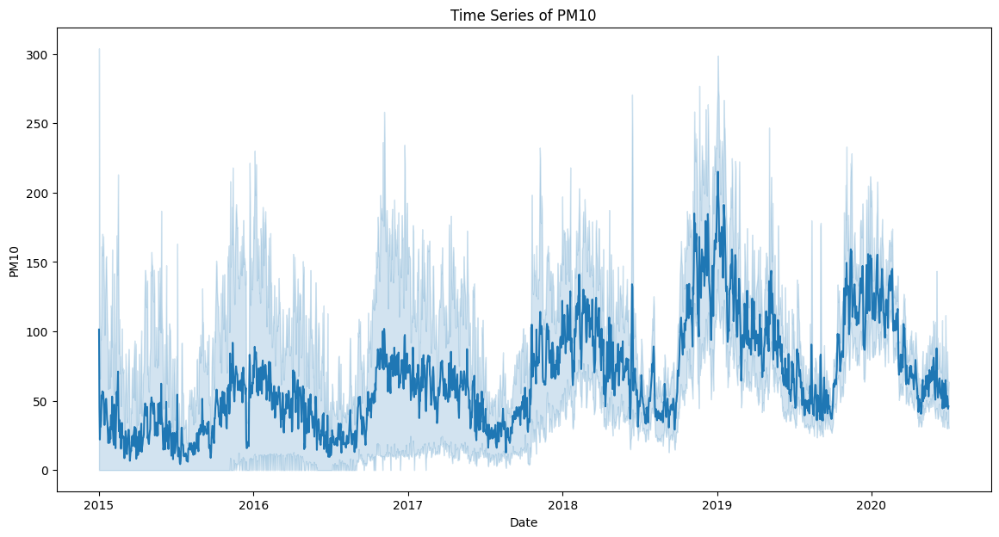

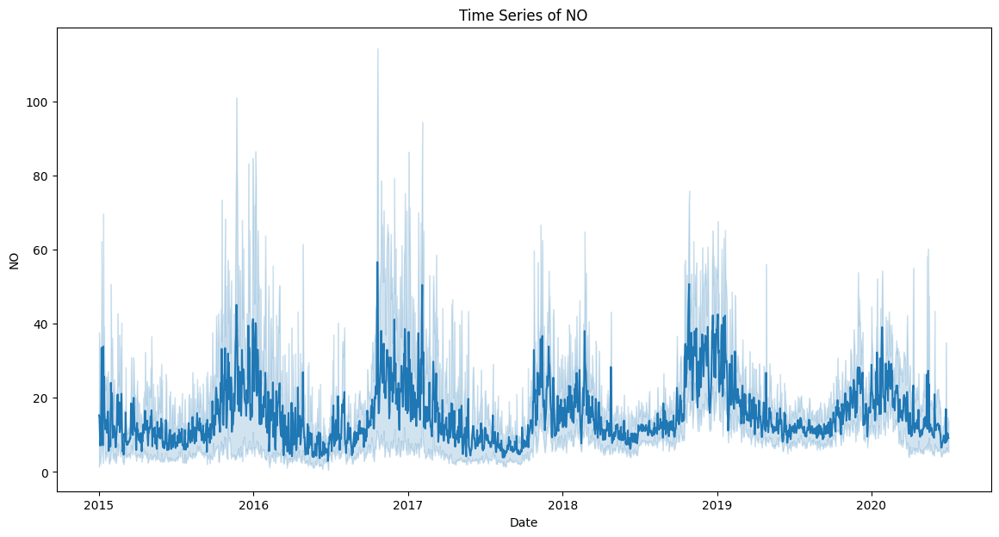

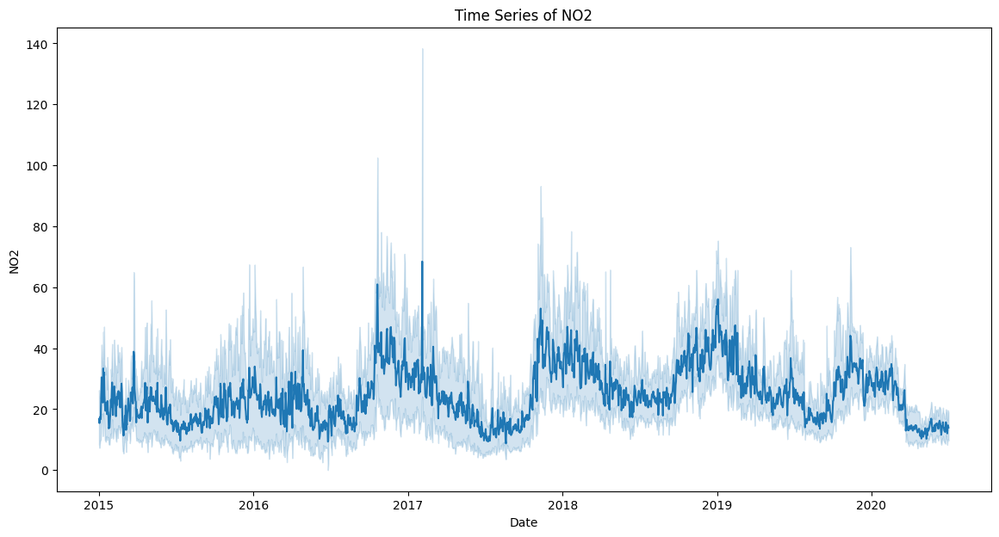

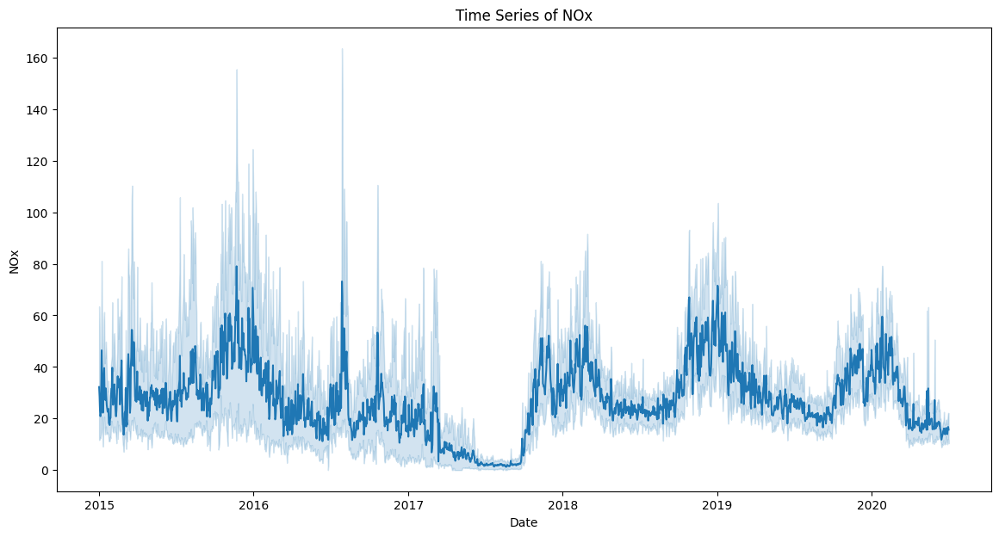

...

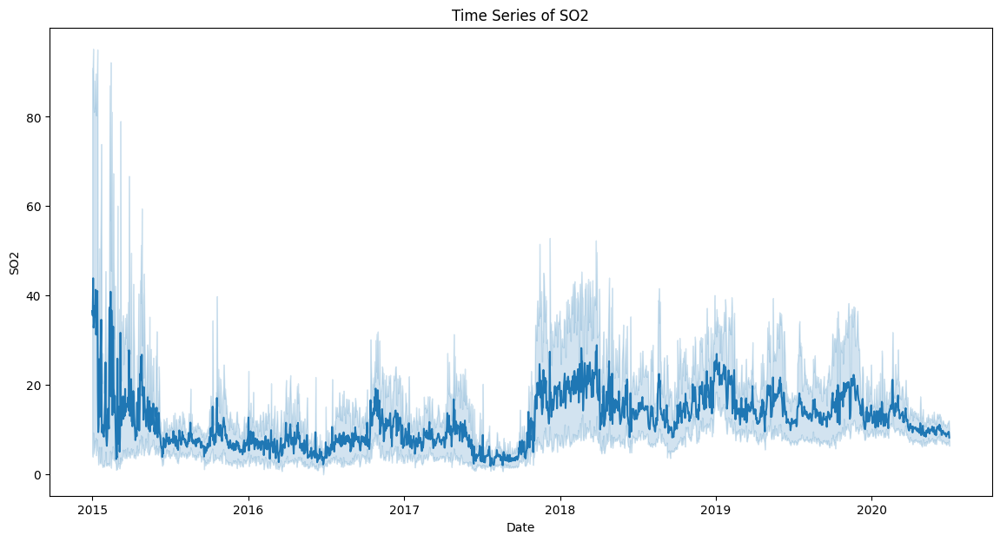

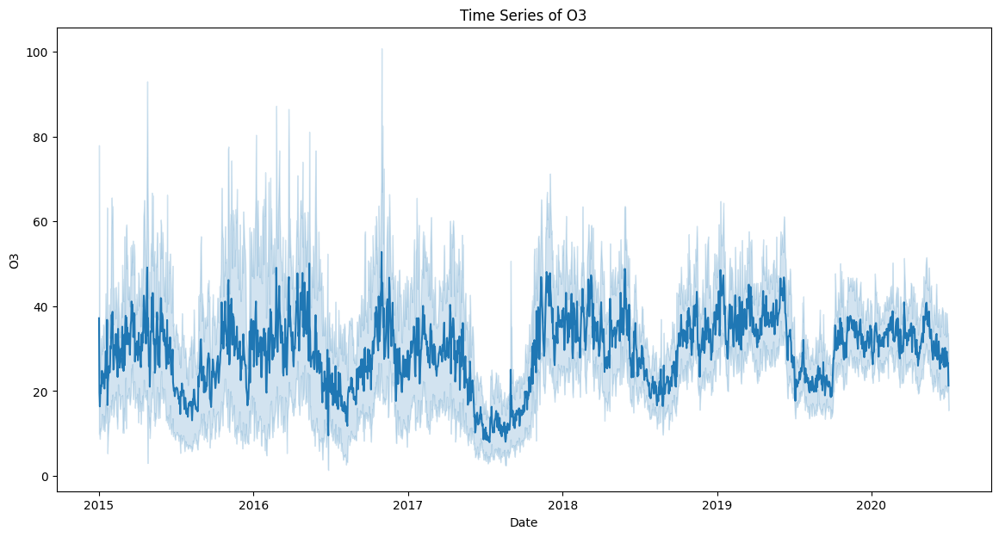

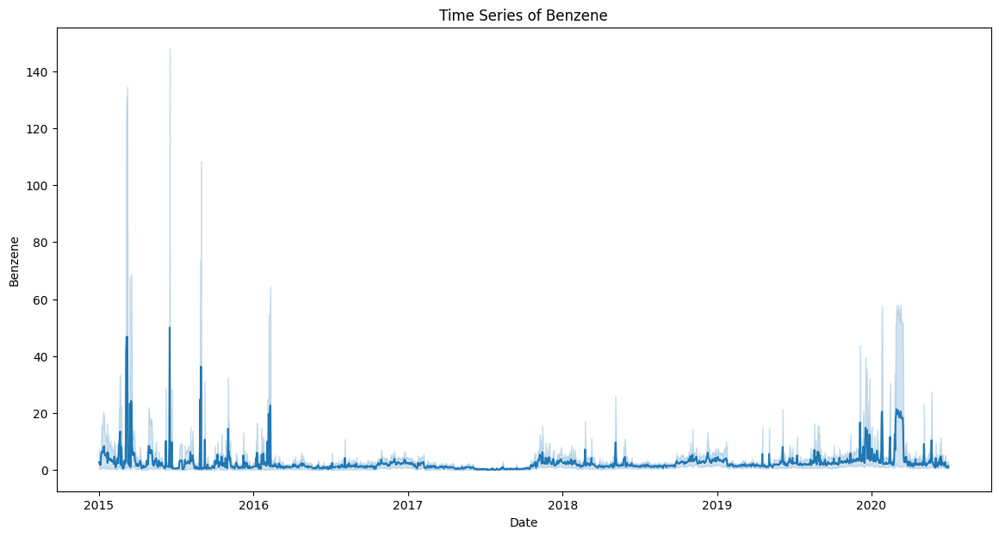

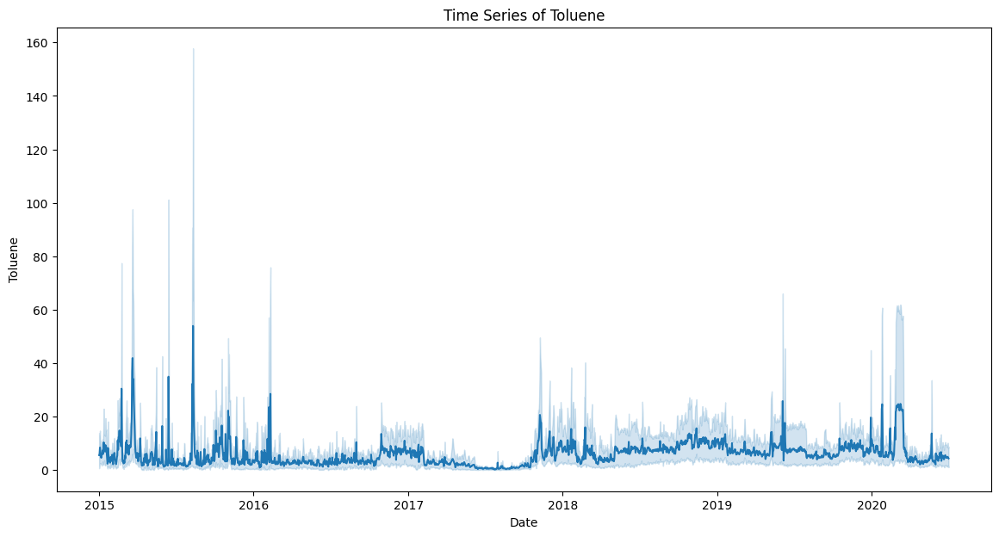

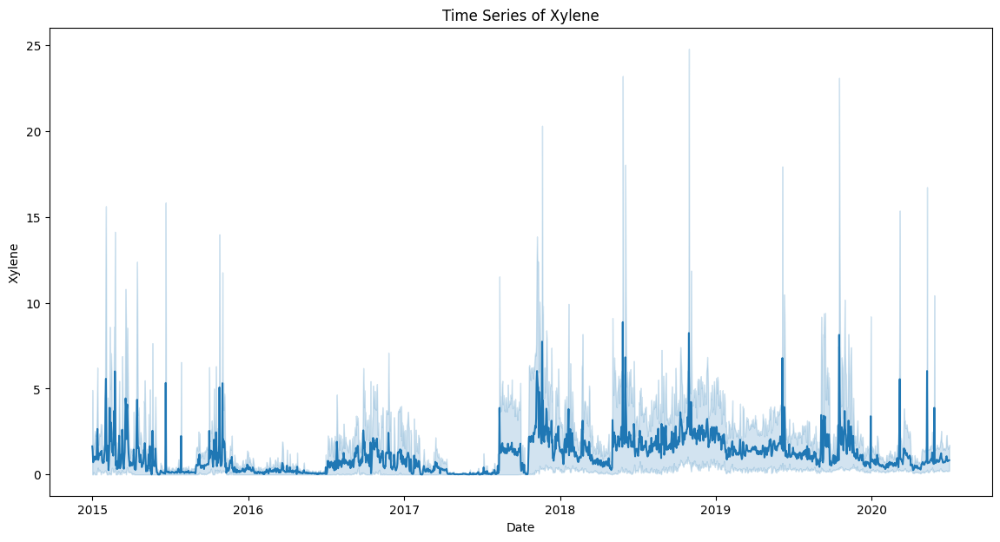

In [ ]:
# Convert the 'Date' column to datetime
dataset['Date'] = pd.to_datetime(dataset['Date'])

# Plot time series for each pollutant
for pollutant in pollutants:
    plt.figure(figsize=(14, 7))
    sns.lineplot(x='Date', y=pollutant, data=dataset)
    plt.title(f'Time Series of {pollutant}')
    plt.xlabel('Date')
    plt.ylabel(pollutant)
    plt.show()


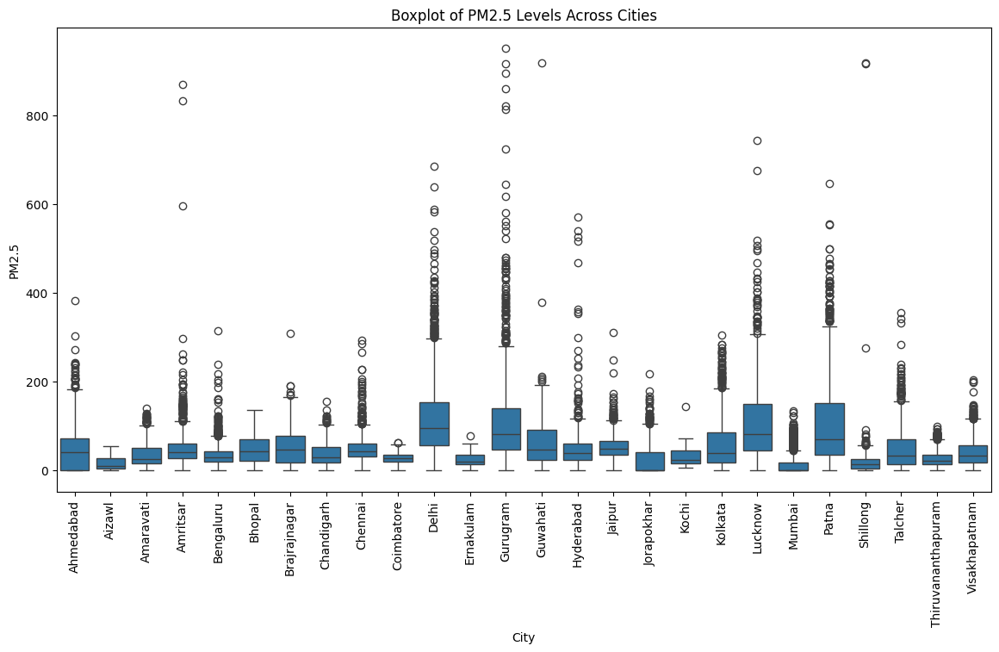

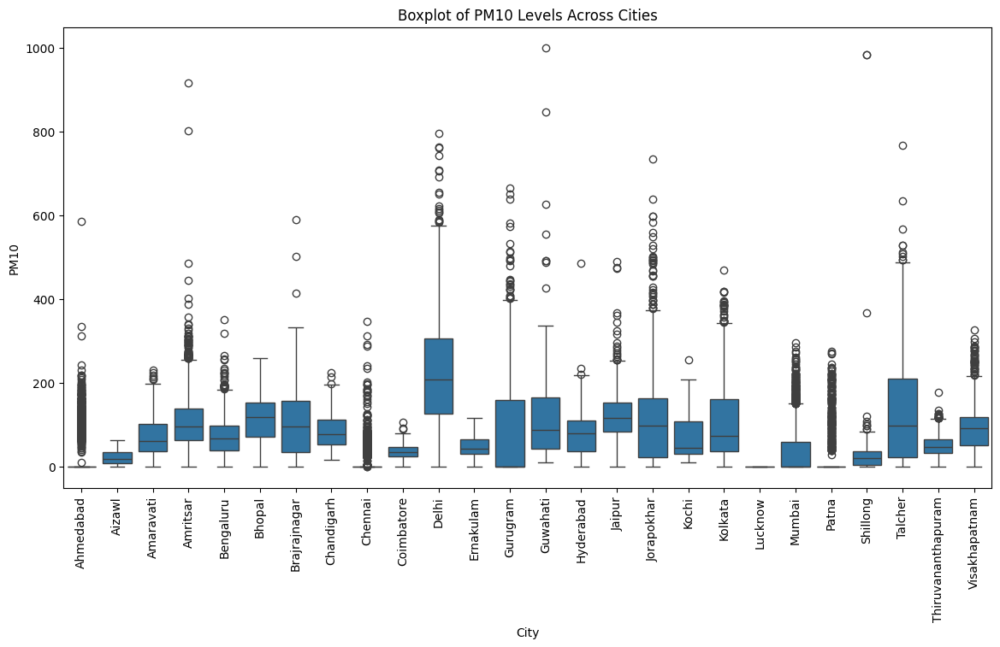

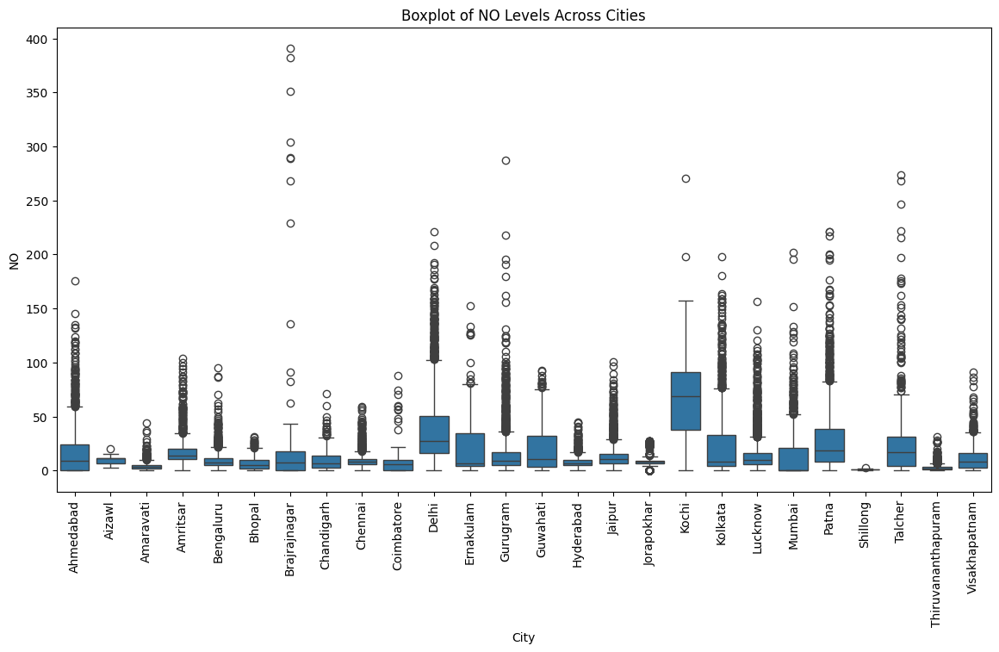

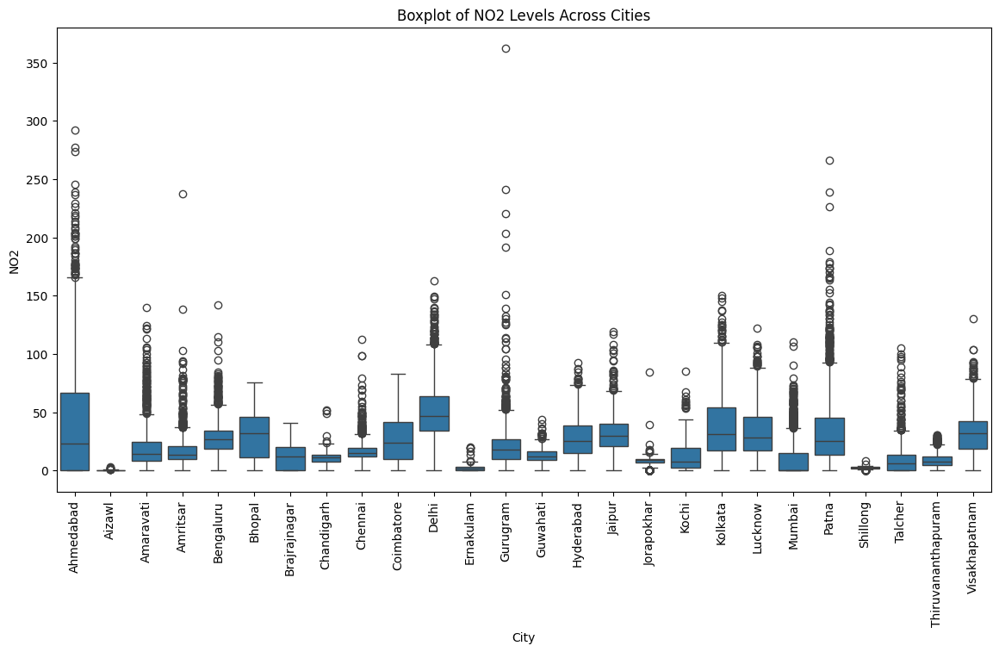

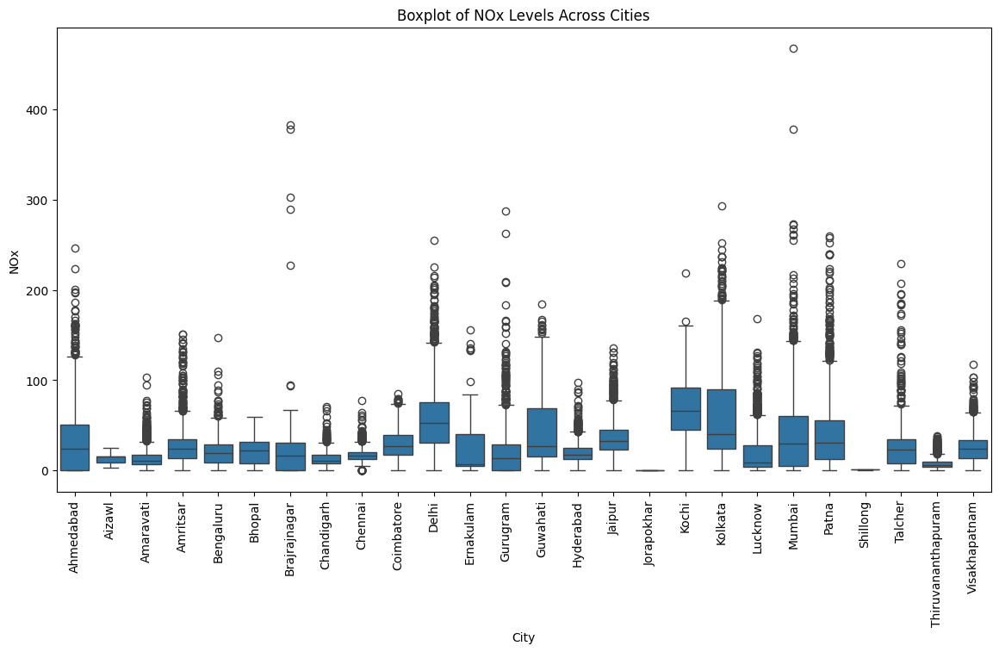

...

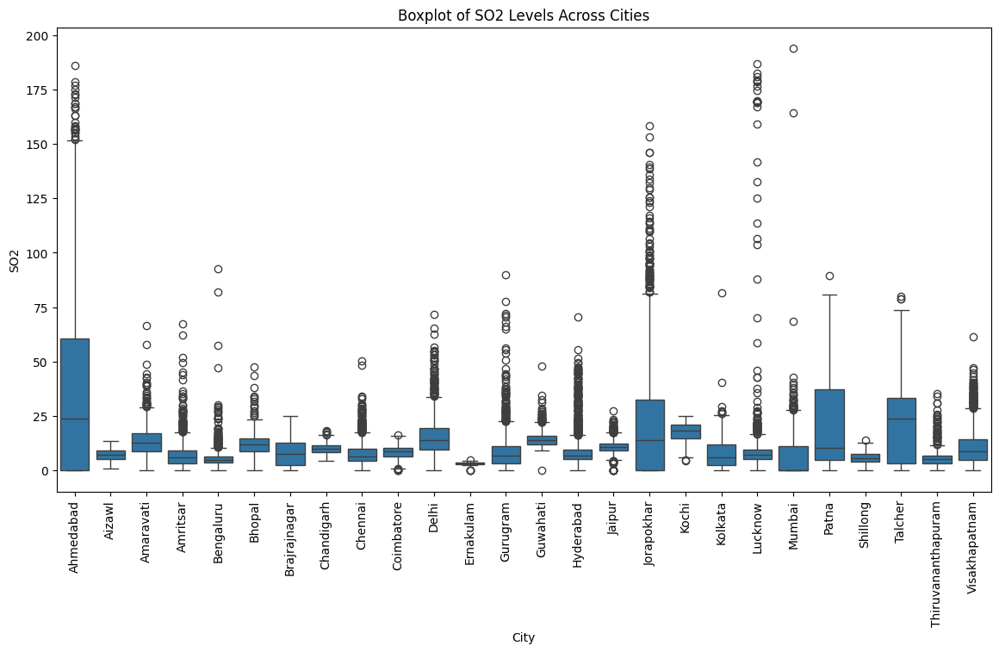

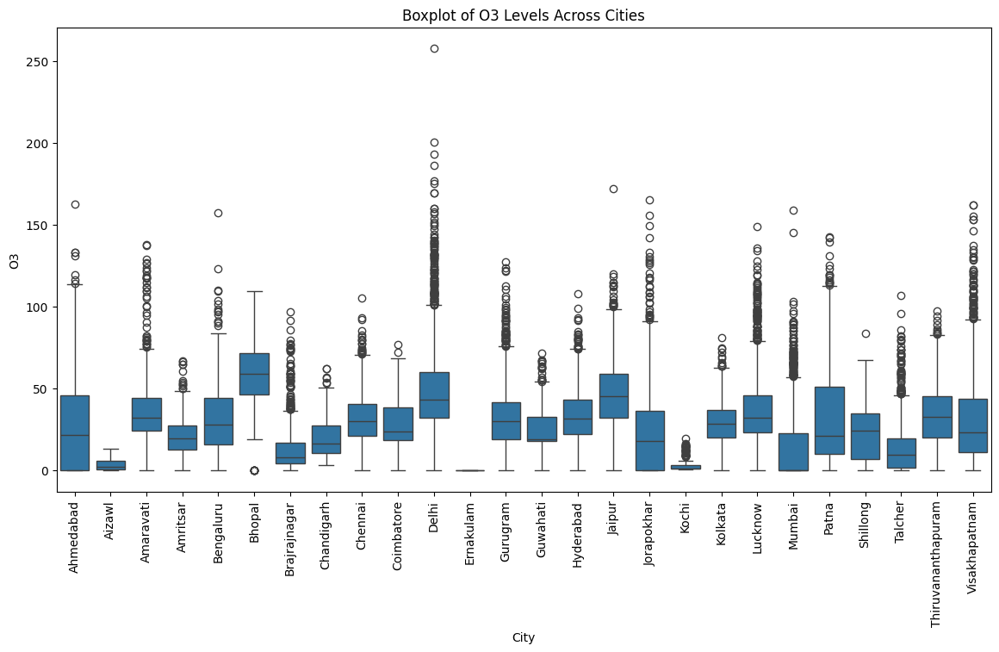

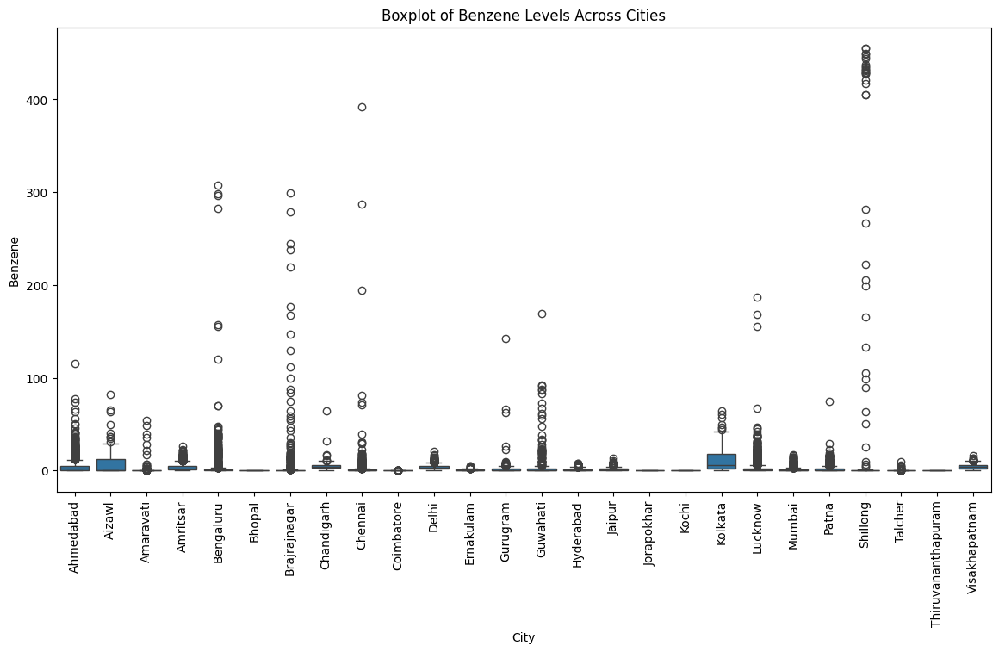

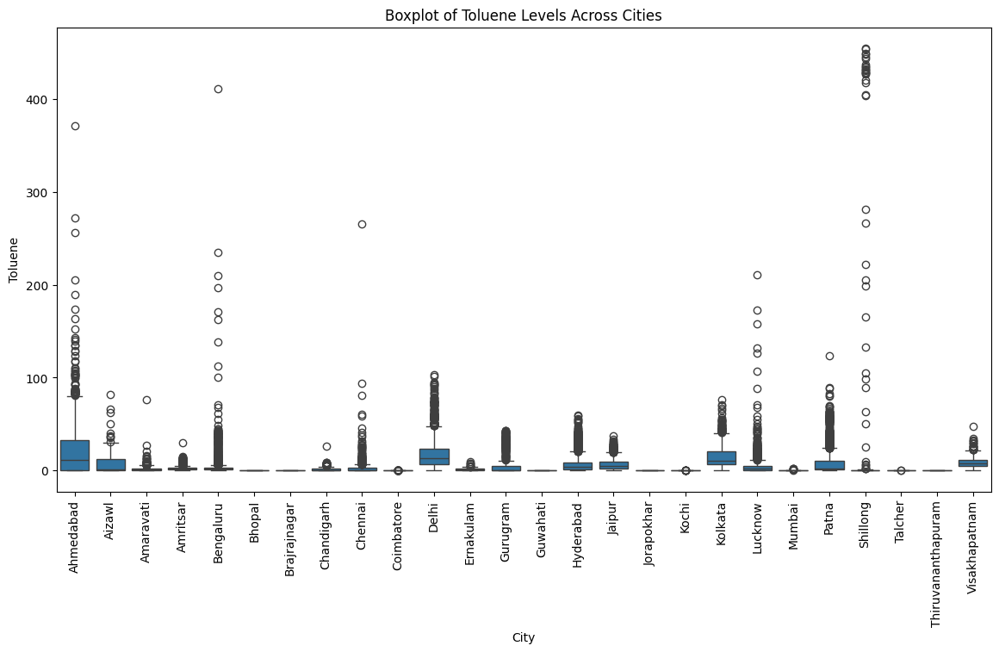

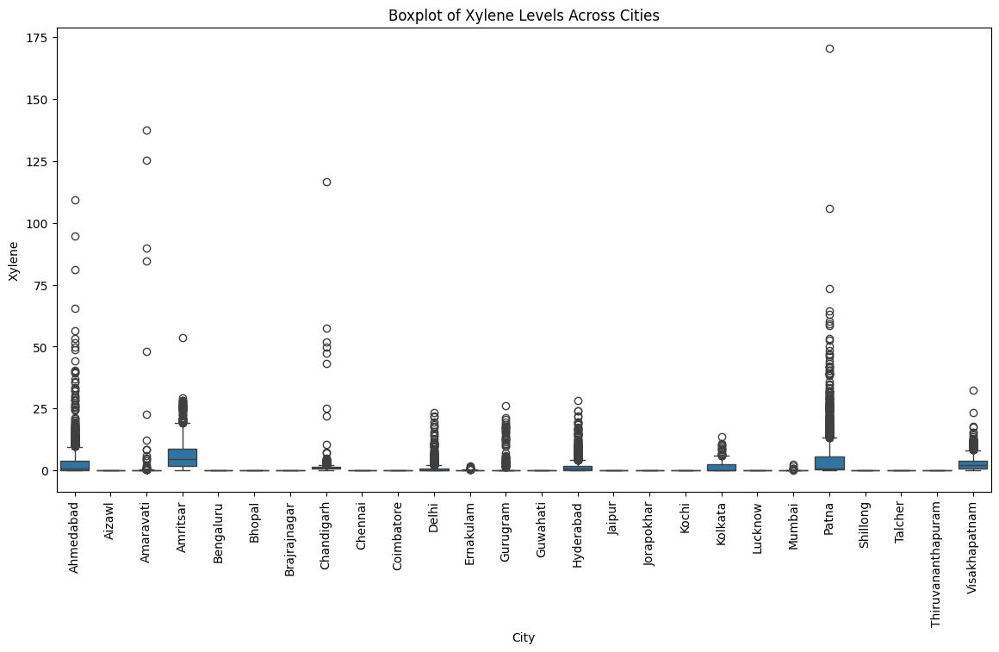

In [ ]:
for pollutant in pollutants:
    plt.figure(figsize=(14, 7))
    sns.boxplot(x='City', y=pollutant, data=dataset)
    plt.title(f'Boxplot of {pollutant} Levels Across Cities')
    plt.xlabel('City')
    plt.ylabel(pollutant)
    plt.xticks(rotation=90)
    plt.show()


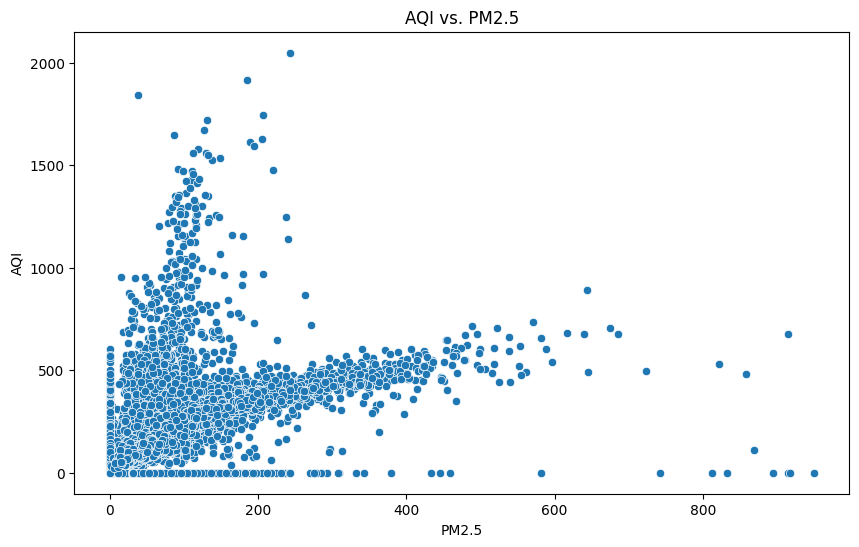

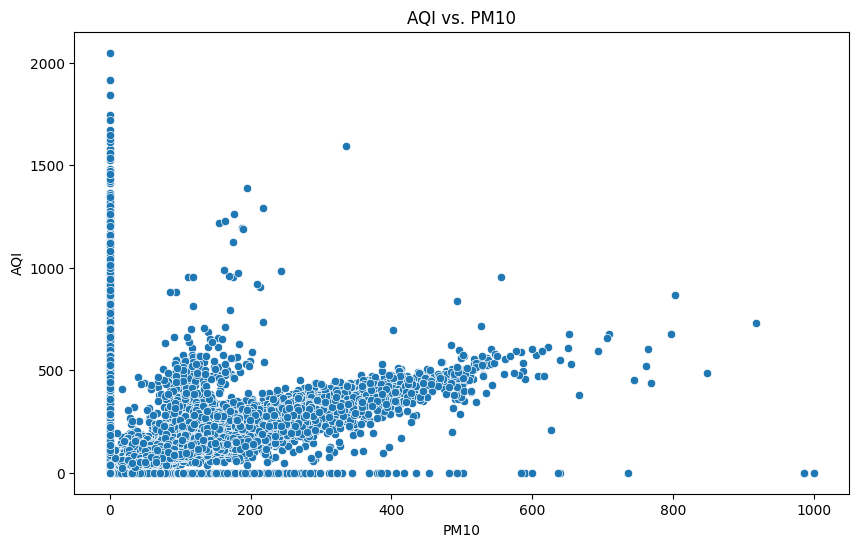

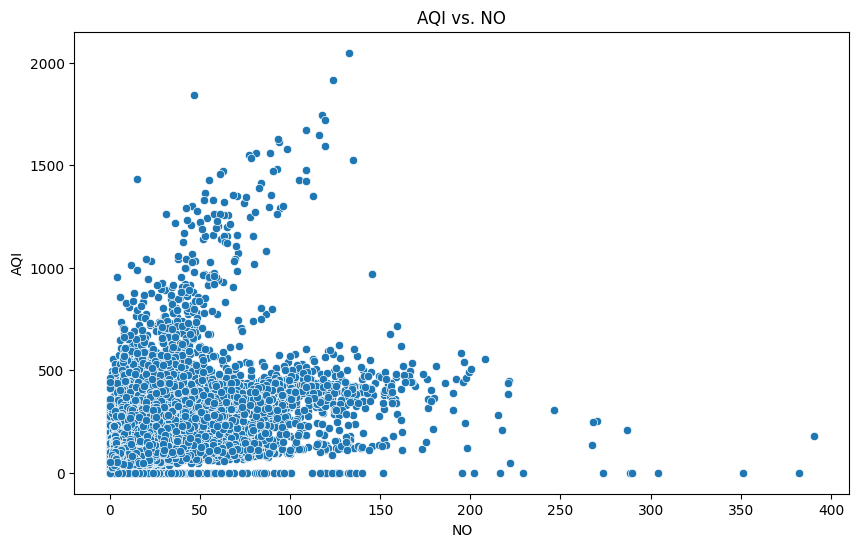

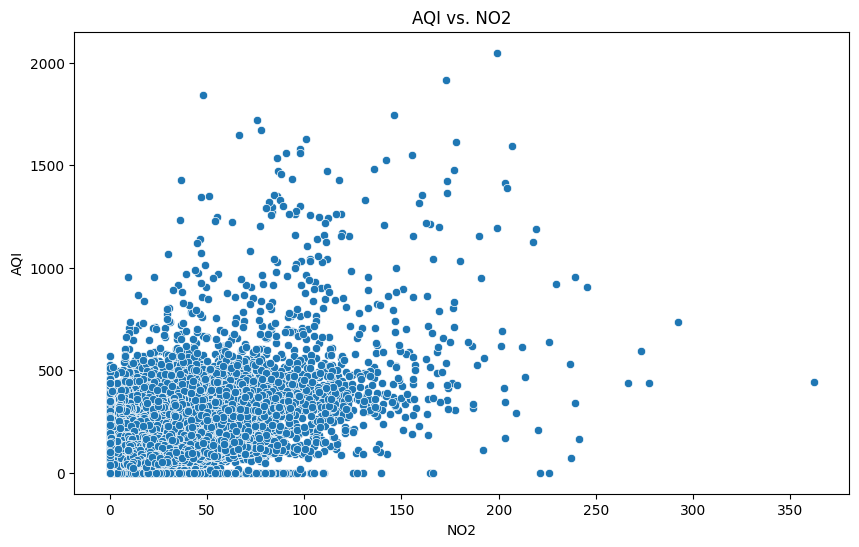

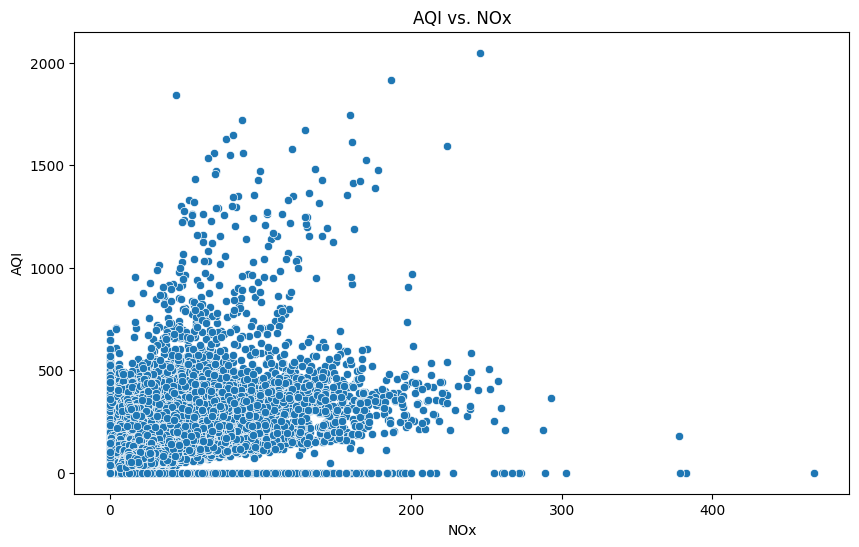

...

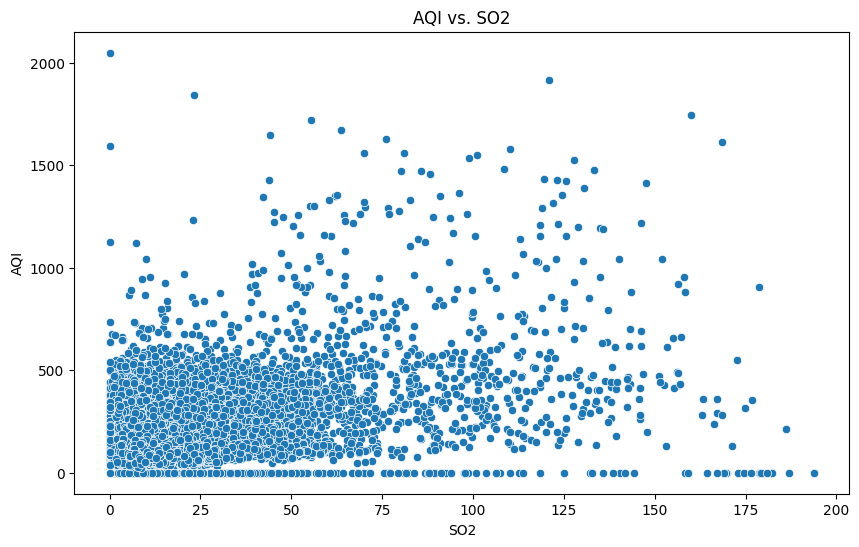

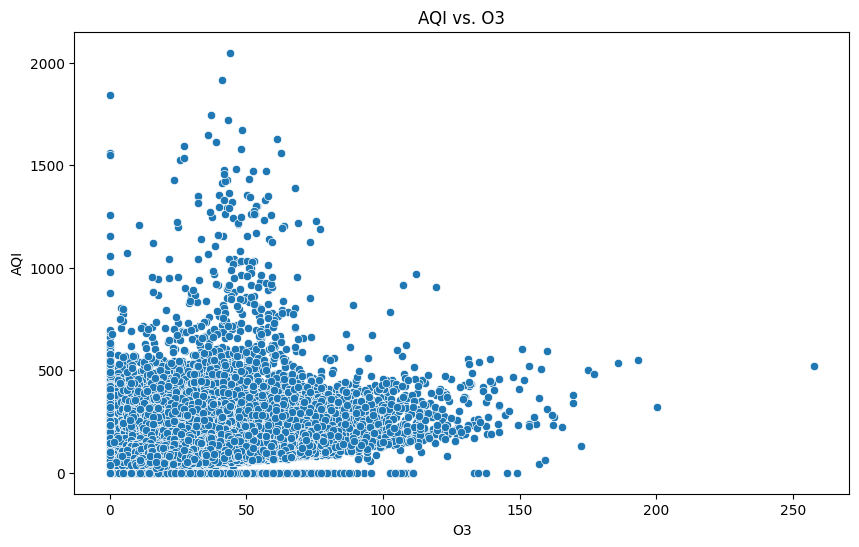

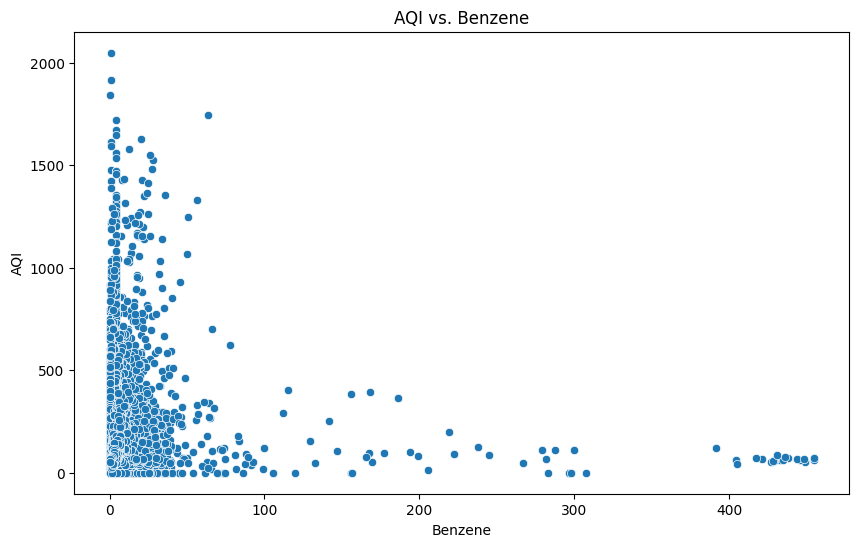

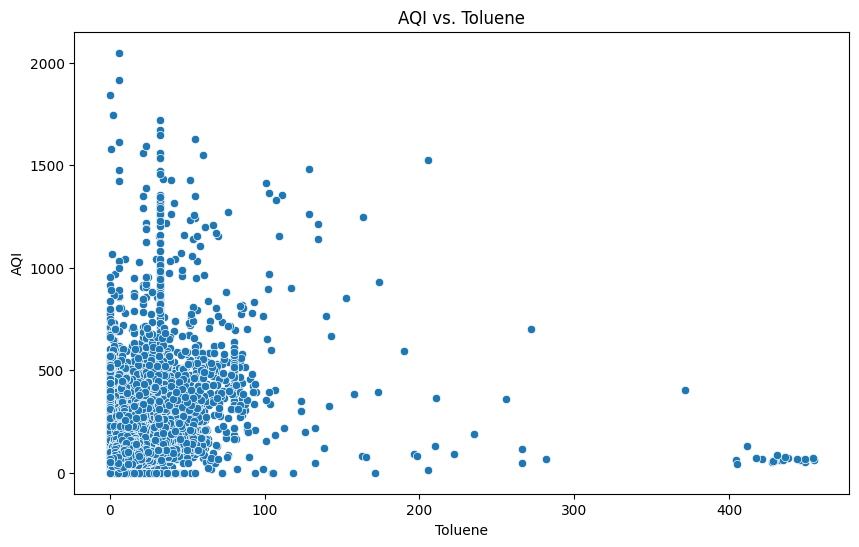

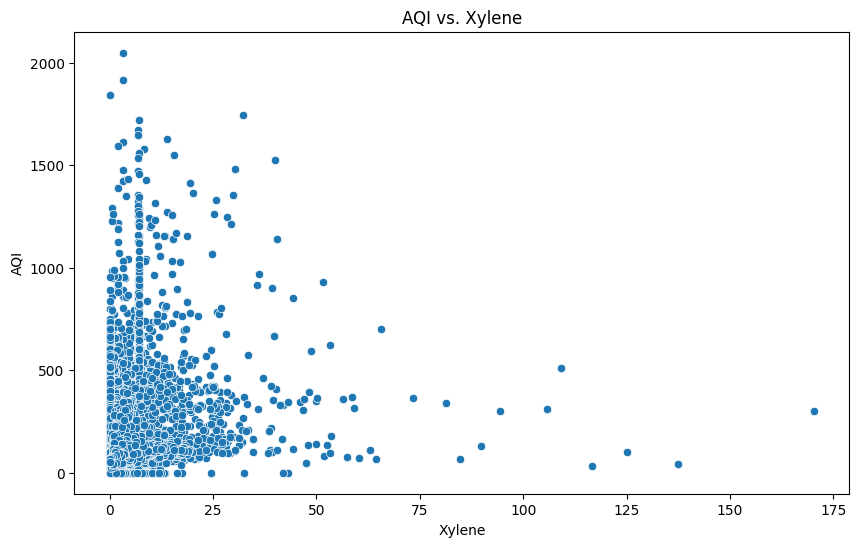

In [ ]:
for pollutant in pollutants:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=pollutant, y='AQI', data=dataset)
    plt.title(f'AQI vs. {pollutant}')
    plt.xlabel(pollutant)
    plt.ylabel('AQI')
    plt.show()


City
Ahmedabad             2009
Delhi                 2009
Mumbai                2009
Bengaluru             2009
Lucknow               2009
Chennai               2009
Hyderabad             2006
Patna                 1858
Gurugram              1679
Visakhapatnam         1462
Amritsar              1221
Jorapokhar            1169
Jaipur                1114
Thiruvananthapuram    1112
Amaravati              951
Brajrajnagar           938
Talcher                925
Kolkata                814
Guwahati               502
Coimbatore             386
Shillong               310
Chandigarh             304
Bhopal                 289
Ernakulam              162
Kochi                  162
Aizawl                 113
Name: count, dtype: int64


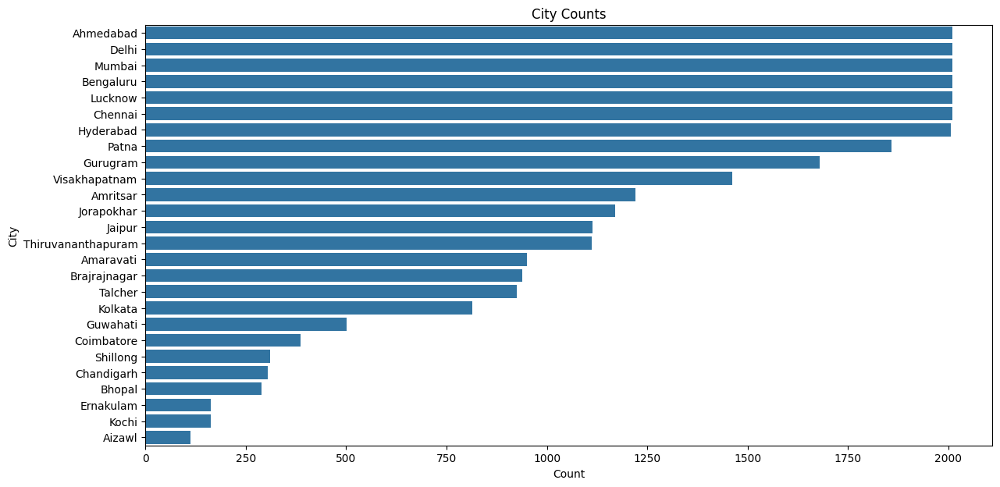

In [ ]:
# Count the occurrences of each city
city_counts = dataset['City'].value_counts()
print(city_counts)

# Plot the city counts
plt.figure(figsize=(14, 7))
sns.countplot(y='City', data=dataset, order=city_counts.index)
plt.title('City Counts')
plt.xlabel('Count')
plt.ylabel('City')
plt.show()


#  AIR QUALITY INDEX

Function to calculate SO2 individual pollutant index

In [ ]:
def cal_SOi(SO2):
    si=0
    if (SO2<=40):
     si= SO2*(50/40)
    elif (SO2>40 and SO2<=80):
     si= 50+(SO2-40)*(50/40)
    elif (SO2>80 and SO2<=380):
     si= 100+(SO2-80)*(100/300)
    elif (SO2>380 and SO2<=800):
     si= 200+(SO2-380)*(100/420)
    elif (SO2>800 and SO2<=1600):
     si= 300+(SO2-800)*(100/800)
    elif (SO2>1600):
     si= 400+(SO2-1600)*(100/800)
    return si
dataset['SOi']=dataset['SO2'].apply(cal_SOi)
data= dataset[['SO2','SOi']]
data.head()
# calculating the individual pollutant index for so2(sulphur dioxide)

,SO2,SOi
0,27.64,34.5500
1,24.55,30.6875
2,29.07,36.3375
3,18.59,23.2375
4,39.33,49.1625


Function to calculate NO2 individual pollutant index

In [ ]:
def cal_NOi(NO2):
    ni=0
    if(NO2<=40):
     ni= NO2*50/40
    elif(NO2>40 and NO2<=80):
     ni= 50+(NO2-40)*(50/40)
    elif(NO2>80 and NO2<=180):
     ni= 100+(NO2-80)*(100/100)
    elif(NO2>180 and NO2<=280):
     ni= 200+(NO2-180)*(100/100)
    elif(NO2>280 and NO2<=400):
     ni= 300+(NO2-280)*(100/120)
    else:
     ni= 400+(NO2-400)*(100/120)
    return ni
dataset['NOi']=dataset['NO2'].apply(cal_NOi)
data= dataset[['NO2','NOi']]
data.head()
# calculating the individual pollutant index for no2(nitrogen dioxide)

,NO2,NOi
0,18.22,22.7750
1,15.69,19.6125
2,19.30,24.1250
3,18.48,23.1000
4,21.42,26.7750



function to calculate PM2.5 individual pollutant index

In [ ]:
def cal_PM25i(PM25):
    if PM25 <= 30:
        pi = PM25 * (50 / 30)
    elif PM25 > 30 and PM25 <= 60:
        pi = 50 + (PM25 - 30) * (50 / 30)
    elif PM25 > 60 and PM25 <= 90:
        pi = 100 + (PM25 - 60) * (100 / 30)
    elif PM25 > 90 and PM25 <= 120:
        pi = 200 + (PM25 - 90) * (100 / 30)
    elif PM25 > 120 and PM25 <= 250:
        pi = 300 + (PM25 - 120) * (100 / 130)
    elif PM25 > 250:
        pi = 400 + (PM25 - 250) * (100 / 250)
    return pi

# Applying the function to the dataset
dataset['PM25i'] = dataset['PM2.5'].apply(cal_PM25i)
data = dataset[['PM2.5', 'PM25i']]
data.head()


,PM2.5,PM25i
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0


function to calculate PM10 individual pollutant index

In [ ]:
def cal_PM10i(PM10):
    if PM10 <= 50:
        pi = PM10 * (50 / 50)
    elif PM10 > 50 and PM10 <= 100:
        pi = 50 + (PM10 - 50) * (50 / 50)
    elif PM10 > 100 and PM10 <= 250:
        pi = 100 + (PM10 - 100) * (100 / 150)
    elif PM10 > 250 and PM10 <= 350:
        pi = 200 + (PM10 - 250) * (100 / 100)
    elif PM10 > 350 and PM10 <= 430:
        pi = 300 + (PM10 - 350) * (100 / 80)
    elif PM10 > 430:
        pi = 400 + (PM10 - 430) * (100 / 150)
    return pi

# Applying the function to the dataset
dataset['PM10i'] = dataset['PM10'].apply(cal_PM10i)
data = dataset[['PM10', 'PM10i']]
data.head()


,PM10,PM10i
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0


function to calculate NO individual pollutant index

In [ ]:
def cal_NOi(NO):
    if NO <= 40:
        pi = NO * (50 / 40)
    elif NO > 40 and NO <= 80:
        pi = 50 + (NO - 40) * (50 / 40)
    elif NO > 80 and NO <= 180:
        pi = 100 + (NO - 80) * (100 / 100)
    elif NO > 180 and NO <= 280:
        pi = 200 + (NO - 180) * (100 / 100)
    elif NO > 280 and NO <= 400:
        pi = 300 + (NO - 280) * (100 / 120)
    elif NO > 400:
        pi = 400 + (NO - 400) * (100 / 200)
    return pi

# Applying the function to the dataset
dataset['NOi'] = dataset['NO'].apply(cal_NOi)
data = dataset[['NO', 'NOi']]
data.head()


,NO,NOi
0,0.92,1.1500
1,0.97,1.2125
2,17.40,21.7500
3,1.70,2.1250
4,22.10,27.6250


function to calculate NH3 individual pollutant index

In [ ]:
def cal_NH3i(NH3):
    if NH3 <= 200:
        pi = NH3 * (50 / 200)
    elif NH3 > 200 and NH3 <= 400:
        pi = 50 + (NH3 - 200) * (50 / 200)
    elif NH3 > 400 and NH3 <= 800:
        pi = 100 + (NH3 - 400) * (100 / 400)
    elif NH3 > 800 and NH3 <= 1200:
        pi = 200 + (NH3 - 800) * (100 / 400)
    elif NH3 > 1200 and NH3 <= 1500:
        pi = 300 + (NH3 - 1200) * (100 / 300)
    elif NH3 > 1500:
        pi = 400 + (NH3 - 1500) * (100 / 500)
    return pi

# Applying the function to the dataset
dataset['NH3i'] = dataset['NH3'].apply(cal_NH3i)
data = dataset[['NH3', 'NH3i']]
data.head()


,NH3,NH3i
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0


function to calculate CO individual pollutant index

In [ ]:
def cal_COi(CO):
    if CO <= 2:
        pi = CO * (50 / 2)
    elif CO > 2 and CO <= 4:
        pi = 50 + (CO - 2) * (50 / 2)
    elif CO > 4 and CO <= 8:
        pi = 100 + (CO - 4) * (100 / 4)
    elif CO > 8 and CO <= 12:
        pi = 200 + (CO - 8) * (100 / 4)
    elif CO > 12 and CO <= 15:
        pi = 300 + (CO - 12) * (100 / 3)
    elif CO > 15:
        pi = 400 + (CO - 15) * (100 / 5)
    return pi

# Applying the function to the dataset
dataset['COi'] = dataset['CO'].apply(cal_COi)
data = dataset[['CO', 'COi']]
data.head()


,CO,COi
0,0.92,23.00
1,0.97,24.25
2,17.40,448.00
3,1.70,42.50
4,22.10,542.00


function to calculate O3 individual pollutant index

In [ ]:
def cal_O3i(O3):
    if O3 <= 50:
        pi = O3 * (50 / 50)
    elif O3 > 50 and O3 <= 100:
        pi = 50 + (O3 - 50) * (50 / 50)
    elif O3 > 100 and O3 <= 180:
        pi = 100 + (O3 - 100) * (100 / 80)
    elif O3 > 180 and O3 <= 240:
        pi = 200 + (O3 - 180) * (100 / 60)
    elif O3 > 240 and O3 <= 300:
        pi = 300 + (O3 - 240) * (100 / 60)
    elif O3 > 300:
        pi = 400 + (O3 - 300) * (100 / 150)
    return pi

# Applying the function to the dataset
dataset['O3i'] = dataset['O3'].apply(cal_O3i)
data = dataset[['O3', 'O3i']]
data.head()


,O3,O3i
0,133.36,141.70
1,34.06,34.06
2,30.70,30.70
3,36.08,36.08
4,39.31,39.31


function to calculate BENZENE individual pollutant index


In [ ]:
def cal_Benzenei(Benzene):
    if Benzene <= 5:
        pi = Benzene * (50 / 5)
    elif Benzene > 5 and Benzene <= 10:
        pi = 50 + (Benzene - 5) * (50 / 5)
    elif Benzene > 10 and Benzene <= 20:
        pi = 100 + (Benzene - 10) * (100 / 10)
    elif Benzene > 20 and Benzene <= 30:
        pi = 200 + (Benzene - 20) * (100 / 10)
    elif Benzene > 30 and Benzene <= 40:
        pi = 300 + (Benzene - 30) * (100 / 10)
    elif Benzene > 40:
        pi = 400 + (Benzene - 40) * (100 / 20)
    return pi

# Applying the function to the dataset
dataset['Benzenei'] = dataset['Benzene'].apply(cal_Benzenei)
data = dataset[['Benzene', 'Benzenei']]
data.head()


,Benzene,Benzenei
0,0.00,0.0
1,3.68,36.8
2,6.80,68.0
3,4.43,44.3
4,7.01,70.1


function to calculate TOLUENE individual pollutant index

In [ ]:
def cal_Toluenei(Toluene):
    if Toluene <= 50:
        pi = Toluene * (50 / 50)
    elif Toluene > 50 and Toluene <= 100:
        pi = 50 + (Toluene - 50) * (50 / 50)
    elif Toluene > 100 and Toluene <= 200:
        pi = 100 + (Toluene - 100) * (100 / 100)
    elif Toluene > 200 and Toluene <= 300:
        pi = 200 + (Toluene - 200) * (100 / 100)
    elif Toluene > 300 and Toluene <= 400:
        pi = 300 + (Toluene - 300) * (100 / 100)
    elif Toluene > 400:
        pi = 400 + (Toluene - 400) * (100 / 200)
    return pi

# Applying the function to the dataset
dataset['Toluenei'] = dataset['Toluene'].apply(cal_Toluenei)
data = dataset[['Toluene', 'Toluenei']]
data.head()


,Toluene,Toluenei
0,0.02,0.02
1,5.50,5.50
2,16.40,16.40
3,10.14,10.14
4,18.89,18.89


function to calculate XYLENE individual pollutant index

In [ ]:
def cal_Xylenei(Xylene):
    if Xylene <= 50:
        pi = Xylene * (50 / 50)
    elif Xylene > 50 and Xylene <= 100:
        pi = 50 + (Xylene - 50) * (50 / 50)
    elif Xylene > 100 and Xylene <= 200:
        pi = 100 + (Xylene - 100) * (100 / 100)
    elif Xylene > 200 and Xylene <= 300:
        pi = 200 + (Xylene - 200) * (100 / 100)
    elif Xylene > 300 and Xylene <= 400:
        pi = 300 + (Xylene - 300) * (100 / 100)
    elif Xylene > 400:
        pi = 400 + (Xylene - 400) * (100 / 200)
    return pi

# Applying the function to the dataset
dataset['Xylenei'] = dataset['Xylene'].apply(cal_Xylenei)
data = dataset[['Xylene', 'Xylenei']]
data.head()


,Xylene,Xylenei
0,0.00,0.00
1,3.77,3.77
2,2.25,2.25
3,1.00,1.00
4,2.78,2.78


function to calculate the air quality index (AQI) of every data value

In [ ]:
def calculate_AQI(dataset):
    # Calculate individual pollutant indices (IPIs) for each pollutant
    dataset['SO2i'] = dataset['SO2'].apply(cal_SOi)
    dataset['PM25i'] = dataset['PM2.5'].apply(cal_PM25i)
    dataset['PM10i'] = dataset['PM10'].apply(cal_PM10i)
    dataset['NOi'] = dataset['NO'].apply(cal_NOi)
    dataset['NH3i'] = dataset['NH3'].apply(cal_NH3i)
    dataset['COi'] = dataset['CO'].apply(cal_COi)
    dataset['O3i'] = dataset['O3'].apply(cal_O3i)
    dataset['Benzenei'] = dataset['Benzene'].apply(cal_Benzenei)
    dataset['Toluenei'] = dataset['Toluene'].apply(cal_Toluenei)
    dataset['Xylenei'] = dataset['Xylene'].apply(cal_Xylenei)
    dataset['NO2i'] = dataset['NO2'].apply(cal_NOi)

    # Determine the maximum IPI value
    dataset['AQI'] = dataset[['SO2i', 'PM25i', 'PM10i', 'NOi', 'NH3i', 'COi', 'O3i', 'Benzenei', 'Toluenei', 'Xylenei', 'NO2i']].max(axis=1)

    return dataset[['SO2', 'PM2.5', 'PM10', 'NO', 'NH3', 'CO', 'O3', 'Benzene', 'Toluene', 'Xylene', 'NO2', 'AQI']]

# Example usage
data = calculate_AQI(dataset)
data.head()


,SO2,PM2.5,PM10,NO,NH3,CO,O3,Benzene,Toluene,Xylene,NO2,AQI
0,27.64,0.0,0.0,0.92,0.0,0.92,133.36,0.00,0.02,0.00,18.22,141.7
1,24.55,0.0,0.0,0.97,0.0,0.97,34.06,3.68,5.50,3.77,15.69,36.8
2,29.07,0.0,0.0,17.40,0.0,17.40,30.70,6.80,16.40,2.25,19.30,448.0
3,18.59,0.0,0.0,1.70,0.0,1.70,36.08,4.43,10.14,1.00,18.48,44.3
4,39.33,0.0,0.0,22.10,0.0,22.10,39.31,7.01,18.89,2.78,21.42,542.0


In [ ]:
def categorize_AQI(AQI):
    if AQI <= 50:
        return 'Good'
    elif AQI <= 100:
        return 'Moderate'
    elif AQI <= 150:
        return 'Unhealthy for Sensitive Groups'
    elif AQI <= 200:
        return 'Unhealthy'
    elif AQI <= 300:
        return 'Very Unhealthy'
    else:
        return 'Hazardous'

# Applying categorization
data['AQI_Category'] = data['AQI'].apply(categorize_AQI)
data.head()


,SO2,PM2.5,PM10,NO,NH3,CO,O3,Benzene,Toluene,Xylene,NO2,AQI,AQI_Category
0,27.64,0.0,0.0,0.92,0.0,0.92,133.36,0.00,0.02,0.00,18.22,141.7,Unhealthy for Sensitive Groups
1,24.55,0.0,0.0,0.97,0.0,0.97,34.06,3.68,5.50,3.77,15.69,36.8,Good
2,29.07,0.0,0.0,17.40,0.0,17.40,30.70,6.80,16.40,2.25,19.30,448.0,Hazardous
3,18.59,0.0,0.0,1.70,0.0,1.70,36.08,4.43,10.14,1.00,18.48,44.3,Good
4,39.33,0.0,0.0,22.10,0.0,22.10,39.31,7.01,18.89,2.78,21.42,542.0,Hazardous


In [ ]:
data['AQI_Category'].value_counts()
# These are the counts of values present in the AQI_Range column.

,count
AQI_Category,
Moderate,8352
Good,6815
Unhealthy for Sensitive Groups,5272
Hazardous,4365
Very Unhealthy,2422
Unhealthy,2305


In [ ]:
import pickle

# Save the Random Forest model
with open('random_forest_model.pkl', 'wb') as file:
    pickle.dump(rf_model, file)
